# Data cleanup and preannotation


In [4]:
from PythIon.DataTypes import CoreTypes as ct
from PythIon.io.coreio import EDHReader
from PythIon.parsers.parsers import SpeedyStatSplit
from PythIon.DataTypes import DataTypes as dt
from PythIon.parsers.parsers import SpikeParser
import os
import pandas as pd
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import glob
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
%matplotlib inline

In [3]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
# matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["pdf.use14corefonts"] = False
plt.rcParams["font.family"]=["Arial"]
plt.rcParams["ps.useafm"] = True
plt.rcParams["figure.dpi"]=150

In [4]:
sfm=dt.SessionFileManager()

In [ ]:
glob.glob("Fixed/**/MBP_P1/**/*dec_pretreatAR20*_*_CH00*/*.edh",recursive=True)

In [5]:
datafiles=[]
datafiles+=glob.glob("Fixed/**/*dec_pretreatAR20*_1[0-9]_CH00[1,2]/*.edh",recursive=True)
datafiles+=glob.glob("Fixed/**/*dec_pretreatAR20*_1_CH00[3,4]/*.edh",recursive=True)
datafiles+=glob.glob("Fixed/**/MBP_P1/**/*dec_pretreatAR20*_*_CH00*/*.edh",recursive=True)
ignored_files = np.loadtxt("ignored_files.csv",
                 delimiter=",", dtype=str).transpose()
for ig_file in ignored_files[0]:
    datafiles.remove(ig_file)

datafiles=[u"".join([u"\\\\?\\",os.path.join(os.getcwd(),filename)]) for filename in datafiles]
# datanames=glob.glob("")
print(*datafiles,sep='\n')

\\?\c:\Users\alito\OneDrive - Northeastern University\Wanunu Lab\Protein Grant\4_Channel_Nanopore_Data\Fixed\MBP Permutations\MBP_P4\alpha_hemolysin\5_31_2024\openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl_10_CH001\openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl.edh
\\?\c:\Users\alito\OneDrive - Northeastern University\Wanunu Lab\Protein Grant\4_Channel_Nanopore_Data\Fixed\MBP Permutations\MBP_P4\alpha_hemolysin\5_31_2024\openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl_10_CH002\openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl.edh
\\?\c:\Users\alito\OneDrive - Northeastern University\Wanunu Lab\Protein Grant\4_Channel_Nanopore_Data\Fixed\MBP Permutations\MBP_P4\alpha_hemolysin\5_31_2024\openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl_11_CH002\openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl.edh
\\?\c:\Users\alito\OneDrive - Northeastern University\Wanunu Lab\Protein Grant\4_Channel_Nanopore_Data\Fixed\MBP Permutations\MBP_P4\alpha_hemolysin\5_31_2024\o

In [6]:
from scipy import signal
class Prefilter():
    def __init__(self,sos):
        self.sos=sos
    def __call__(self,trace):
        trace[:]=signal.sosfiltfilt(self.sos,trace,axis=0)
        return
    # def filt_butter(current,sampling_freq,cutoff_freq,order=2,inplace=True):
    # sos=
    # if inplace:
    #     current[:]=signal.sosfiltfilt(sos,current,axis=0)
    #     return
    # else: 
    #     return signal.sosfiltfilt(sos,current,axis=0)

In [7]:
def select(tracefile,n_remove=1000,rank="vstep",newrank="vstepgap"):
    for v in tracefile.traverse_to_rank(rank):
        # print(v)
        try:
            v.add_child(ct.MetaSegment(start=v.start+n_remove,end=v.end,rank=newrank,parent=v))
        # print(v.children)
        except:
            pass
        
        



In [8]:
sampling_freq=200000
cutoff_freq=10000
order=2

sos=signal.butter(order,cutoff_freq,btype="lowpass",analog=False,output='sos',fs=sampling_freq)

lp_filter=Prefilter(sos)

for datafile in datafiles:
    metadata,current,voltage=EDHReader().read(datafile,voltage_compress=True,downsample=10,prefilter=lp_filter)
    tf=dt.TraceFile(current,voltage,parent=sfm,metadata=metadata,
                         unique_features={"sampling_freq":metadata["eff_sampling_freq"]})
    select(tf,n_remove=100)

In [9]:
from tqdm.notebook import tqdm

0it [00:00, ?it/s]

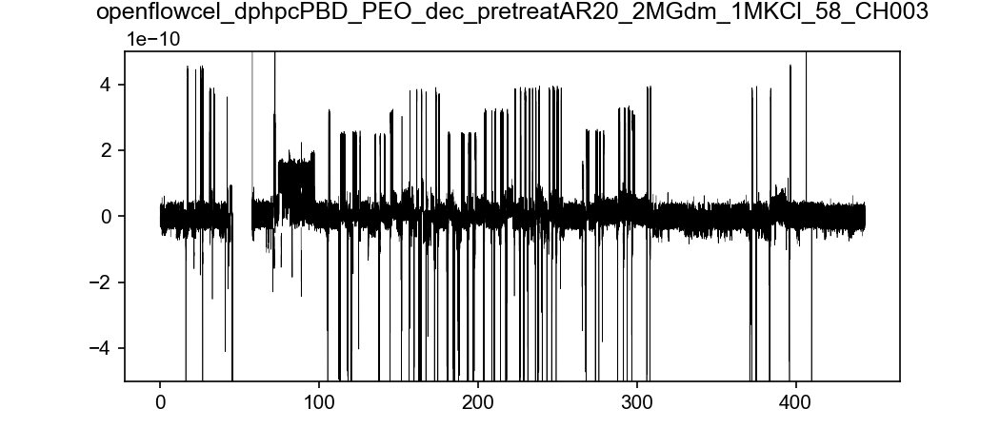

In [10]:
%matplotlib ipympl
plt.ioff()

for i,tf in tqdm(enumerate(sfm.children[17:18])):
    plt.figure(122,figsize=(7,3))
    for child in tf.traverse_to_rank("vstepgap"):
        if -0.25<child.get_feature("voltage") <0.25:
            plt.plot(child.t,child.current,lw=0.3,c='k')
    plt.ylim(-5e-10,5e-10)
    plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
plt.show()

    

In [2]:
%matplotlib inline
# plt.ioff()
tlims=np.array([158.6,159.6])
lims=tlims*20000
lims=lims.astype(int)
for i,tf in tqdm(enumerate(sfm.children[19:20])):
    plt.figure(122,figsize=(8,2))
    # for child in tf.traverse_to_rank("vstepgap"):
        # if -0.25<child.get_feature("voltage") <0.25:
    plt.plot(tf.t[lims[0]:lims[1]],tf.current[lims[0]:lims[1]],lw=0.3,c='k')
    
    plt.ylim(-1e-10,4e-10)
    # plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    plt.plot([158.58,158.58],[-50e-12,150e-12],lw=2,c='k')
    plt.plot([158.58,158.78],[-50e-12,-50e-12],lw=2,c='k')
    
    ax=plt.gca()
    ax.set_axis_off()
    plt.savefig("sexytrace.pdf",bbox_inches='tight')
# plt.show()


NameError: name 'tqdm' is not defined

In [4]:
%matplotlib ipympl
plt.ioff()

for i,tf in tqdm(enumerate(sfm.children[12:13])):
    plt.figure(123,figsize=(7,3))
    for child in tf.traverse_to_rank("vstepgap"):
        if -0.25<child.get_feature("voltage") <0.25:
            plt.plot(child.t,child.current,lw=0.3,c='k')
    plt.ylim(-5e-10,5e-10)
    plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
plt.show()


RuntimeError: 'ipympl is not a recognised GUI loop or backend name

0it [00:00, ?it/s]

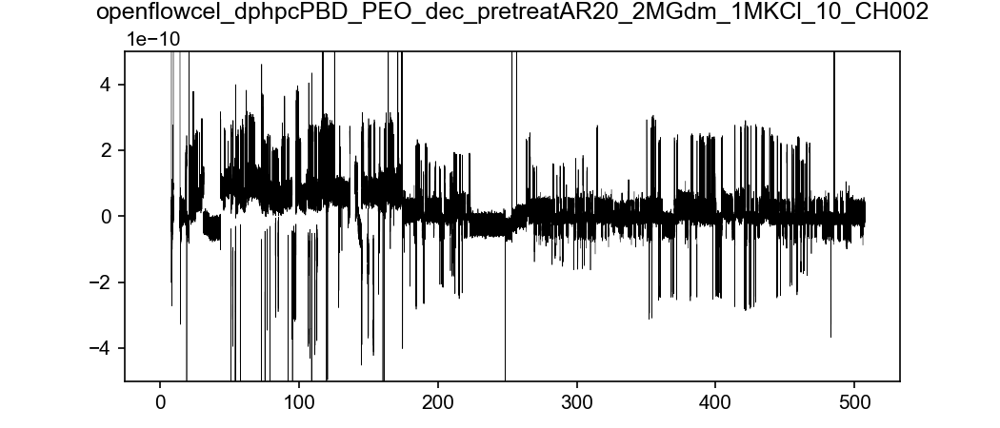

In [12]:
%matplotlib ipympl
plt.ioff()

for i,tf in tqdm(enumerate(sfm.children[1:2])):
    plt.figure(124,figsize=(7,3))
    for child in tf.traverse_to_rank("vstepgap"):
        if -0.25<child.get_feature("voltage") <0.25:
            plt.plot(child.t,child.current,lw=0.3,c='k')
    plt.ylim(-5e-10,5e-10)
    plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
plt.show()


0it [00:00, ?it/s]

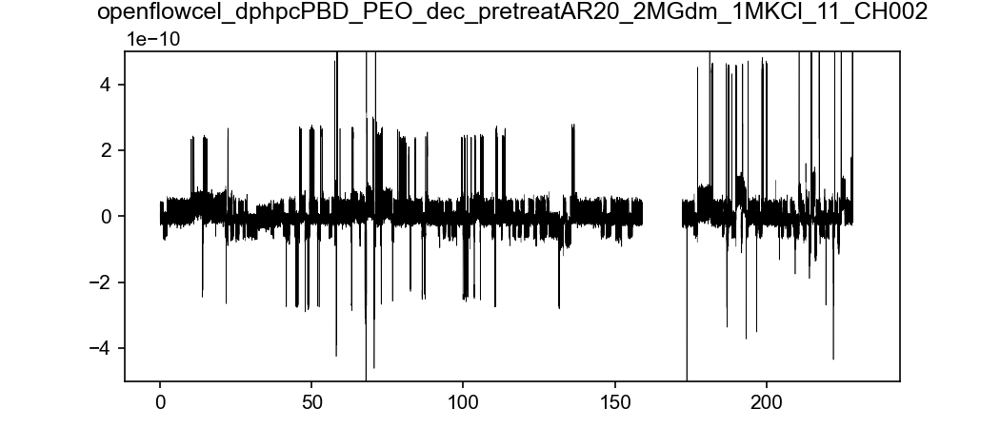

In [13]:
%matplotlib ipympl
plt.ioff()

for i,tf in tqdm(enumerate(sfm.children[2:3])):
    plt.figure(125,figsize=(7,3))
    for child in tf.traverse_to_rank("vstepgap"):
        if -0.25<child.get_feature("voltage") <0.25:
            plt.plot(child.t,child.current,lw=0.3,c='k')
    plt.ylim(-5e-10,5e-10)
    plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
plt.show()


0it [00:00, ?it/s]

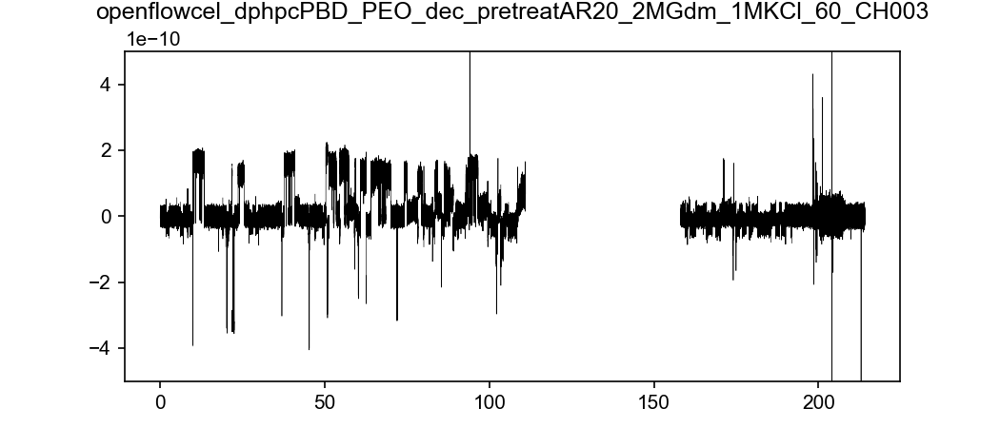

In [108]:
%matplotlib ipympl
plt.ioff()

for i,tf in tqdm(enumerate(sfm.children[21:22])):
    plt.figure(125,figsize=(7,3))
    for child in tf.traverse_to_rank("vstepgap"):
        if -0.25<child.get_feature("voltage") <0.25:
            plt.plot(child.t,child.current,lw=0.3,c='k')
    plt.ylim(-5e-10,5e-10)
    plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
plt.show()


  0%|          | 0/23 [00:00<?, ?it/s]

C:\Users\alito\AppData\Local\Temp\ipykernel_27836\1167531963.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,(ax0,ax1)=plt.subplots(2, 1,sharex=True,num=i+1, gridspec_kw={'height_ratios': [3, 1]},


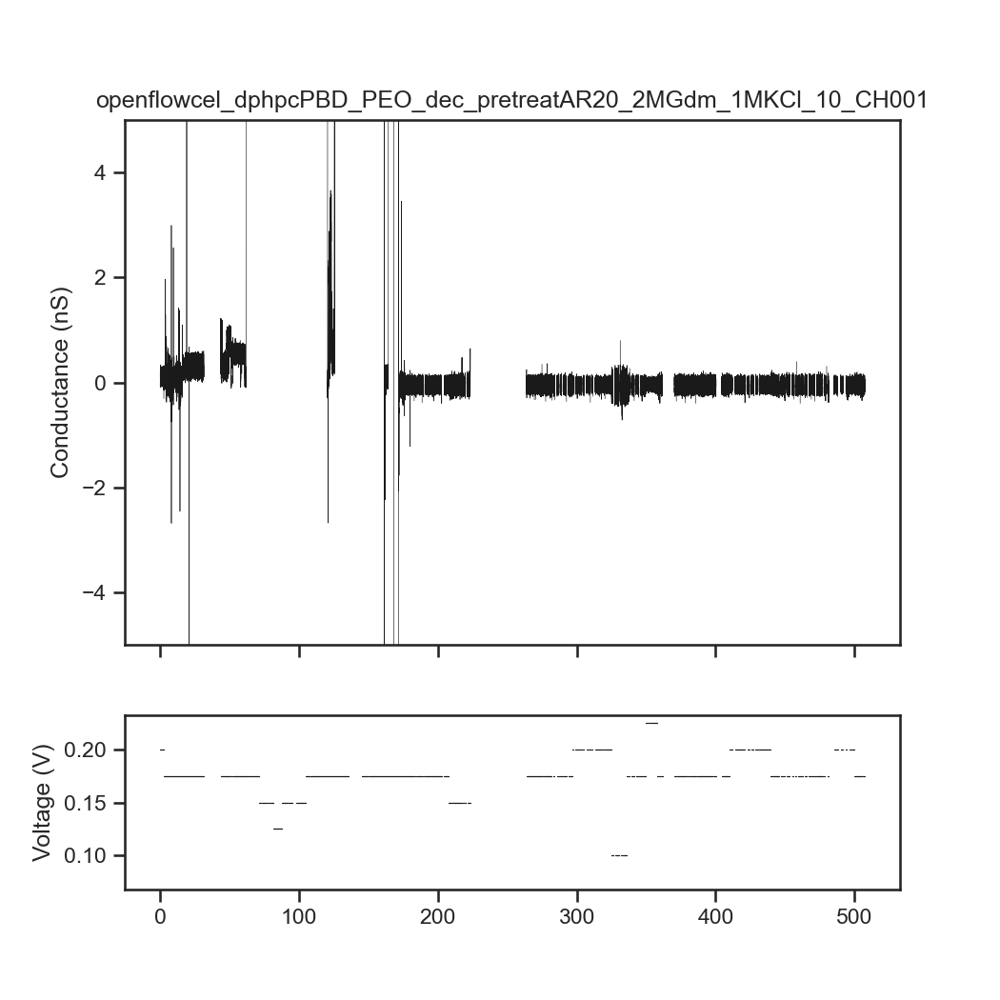

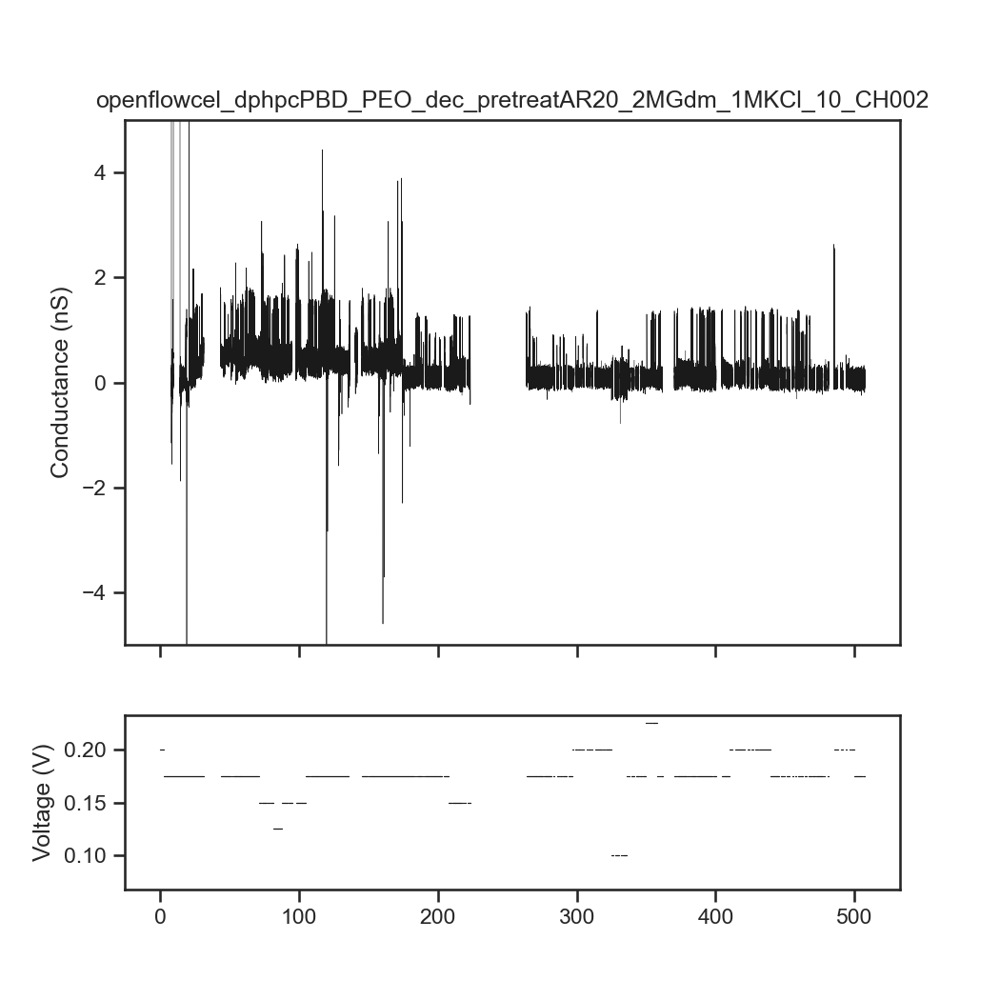

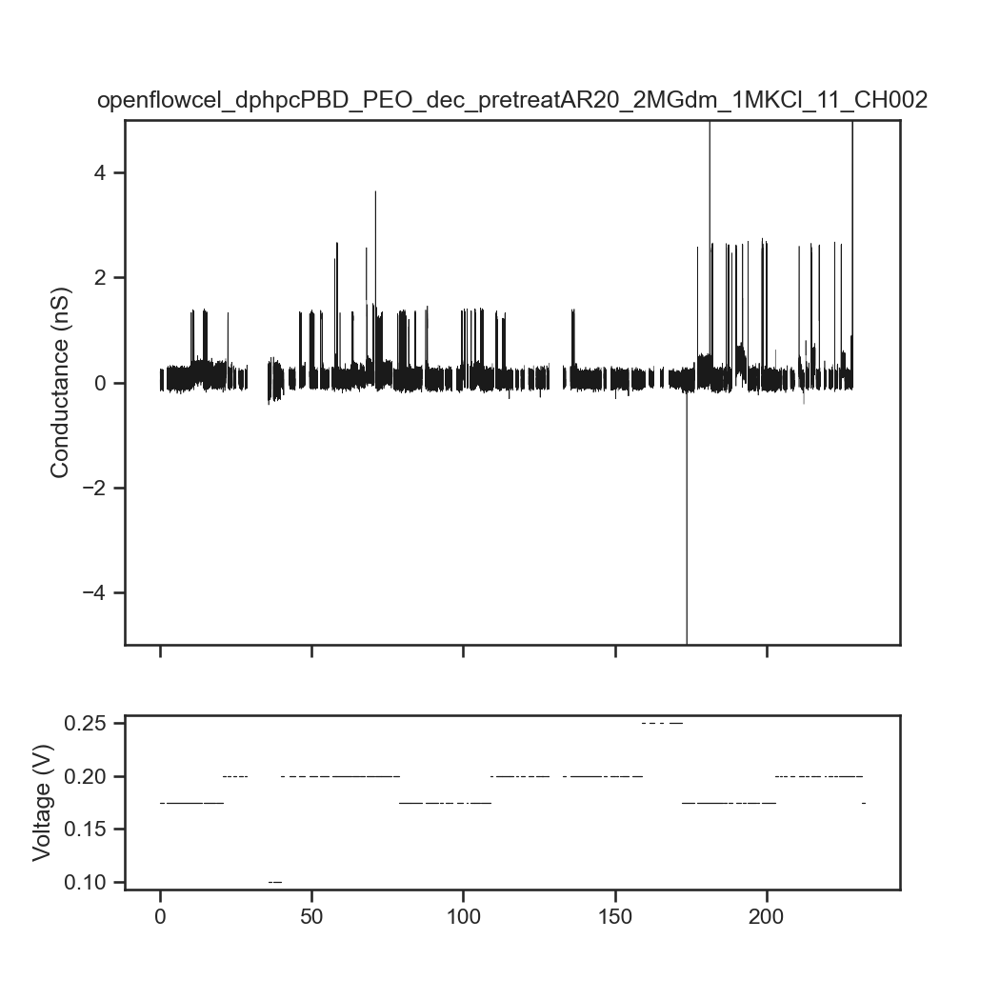

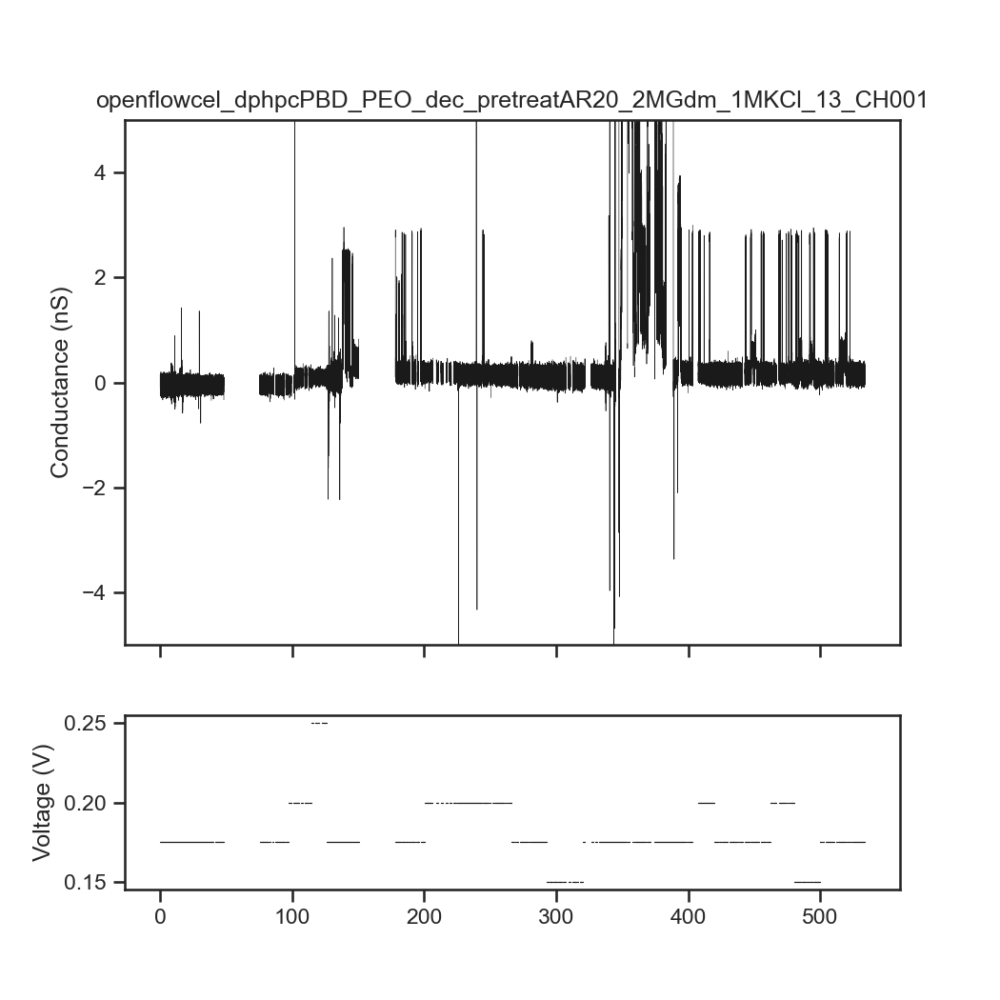

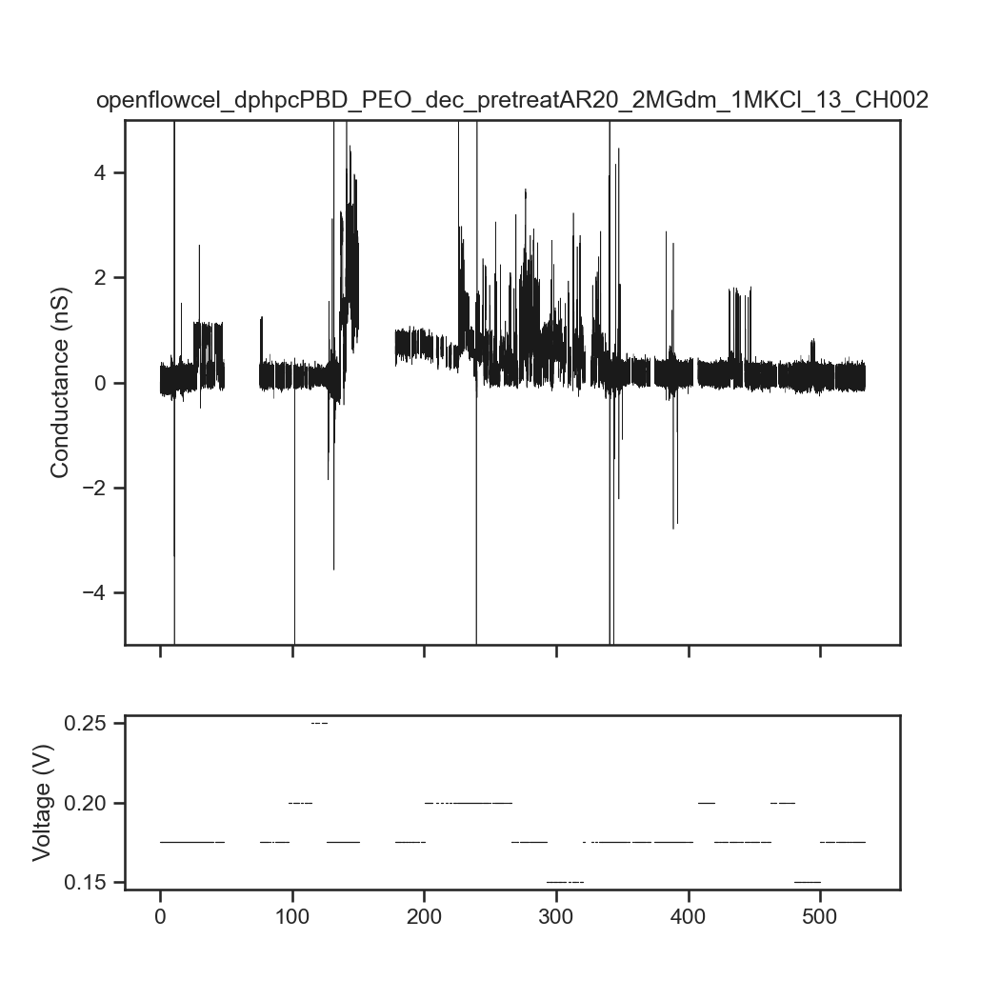

...

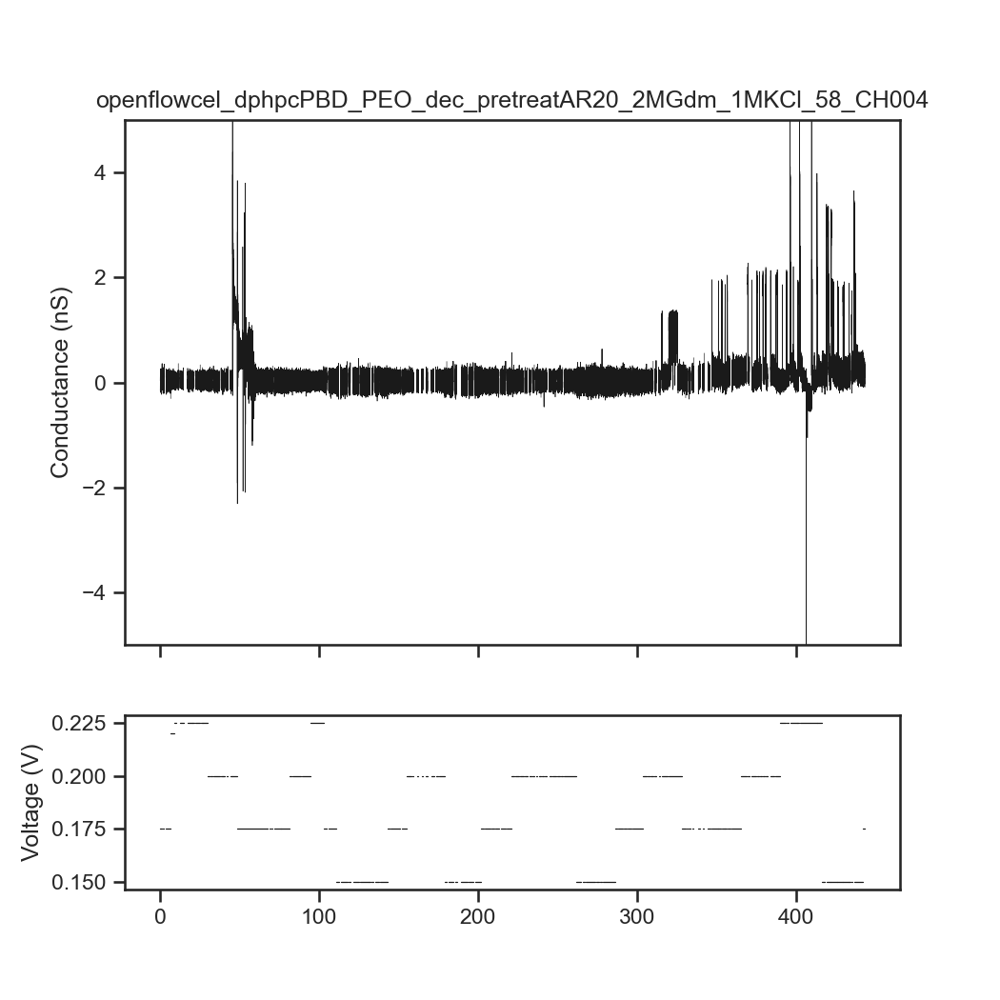

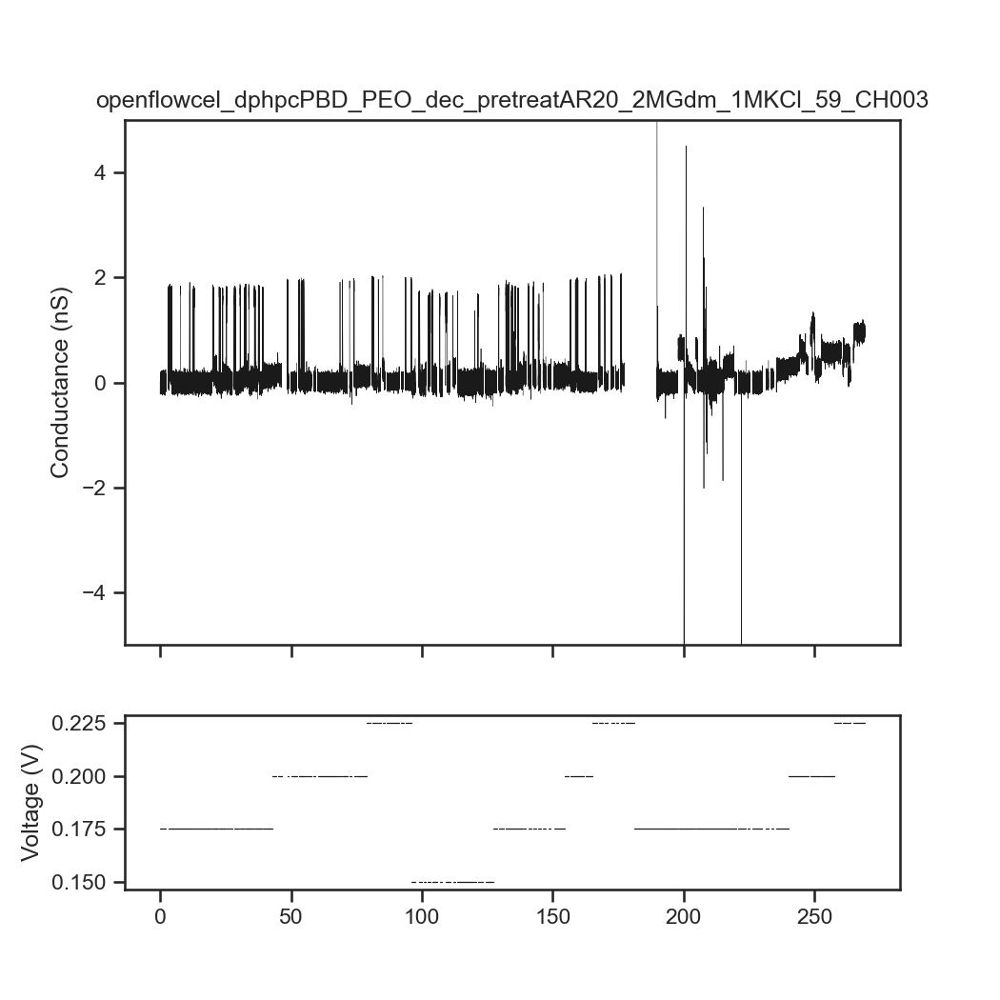

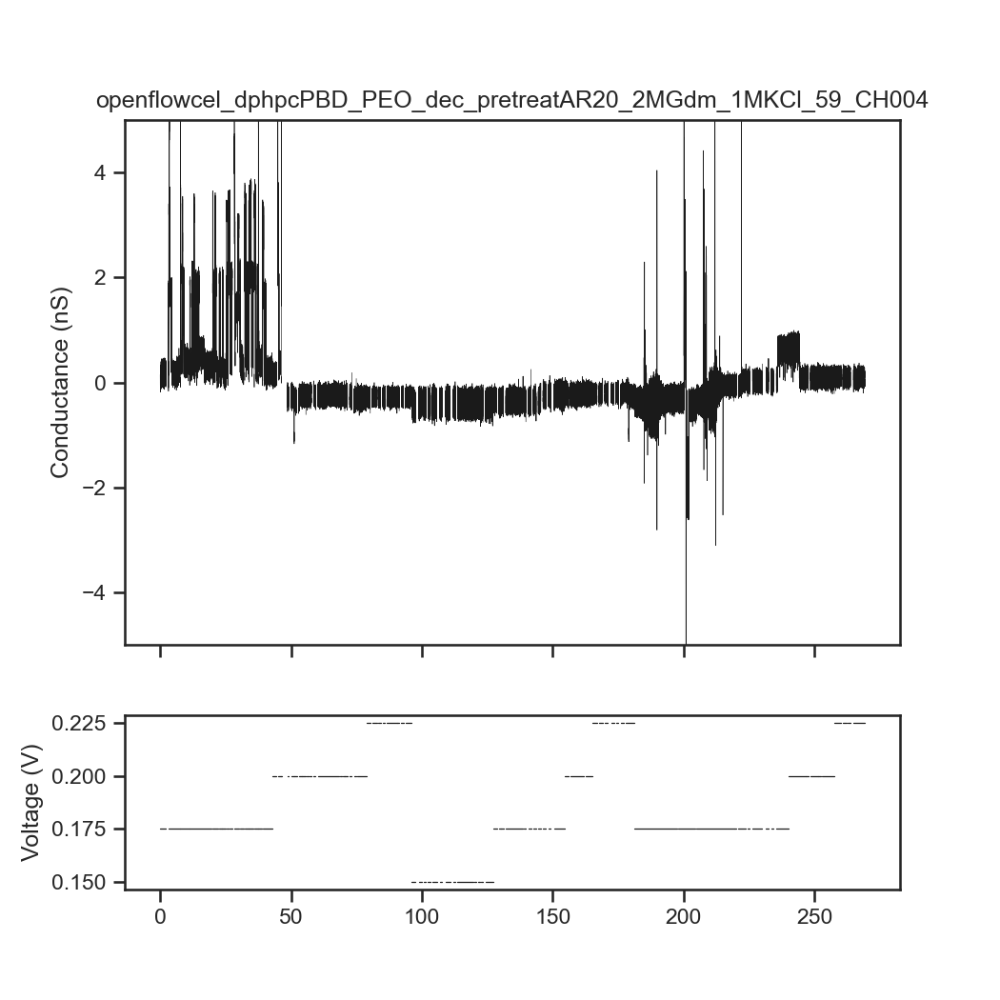

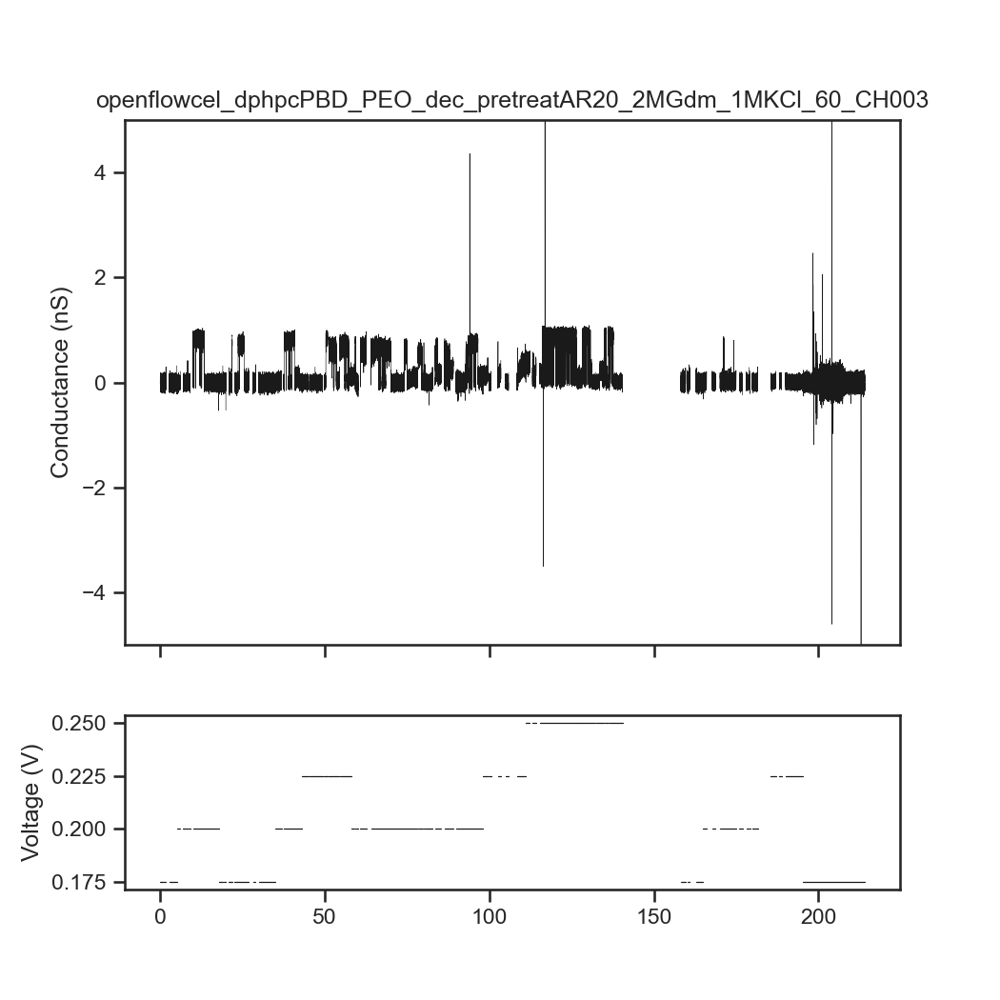

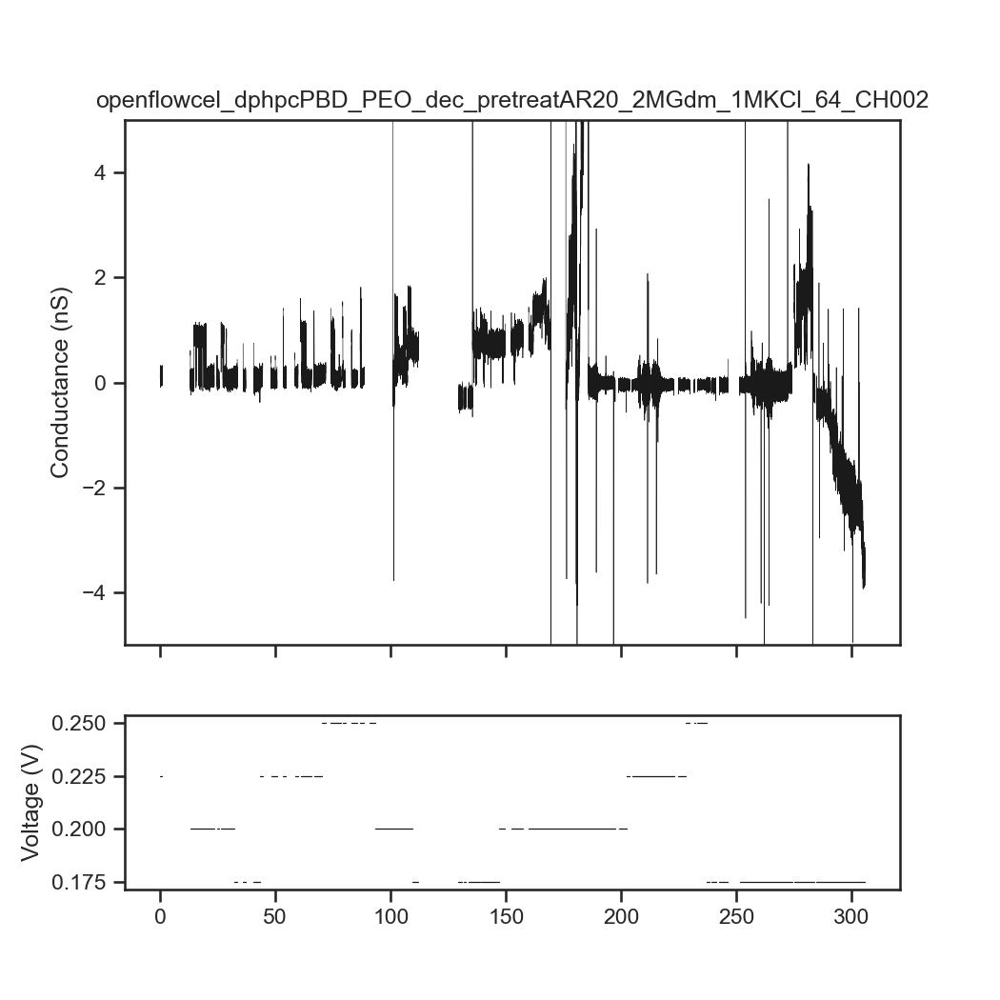

In [275]:
%matplotlib ipympl
plt.ion()
plt.close('all')
for i,tf in tqdm(enumerate(sfm.children),total=len(sfm.children)):
    fig,(ax0,ax1)=plt.subplots(2, 1,sharex=True,num=i+1, gridspec_kw={'height_ratios': [3, 1]},
                               figsize=(7, 7))
    for child in tf.traverse_to_rank("vstepgap"):
        if 0.01<child.get_feature("voltage") <0.251:
            ax0.plot(child.t,child.current*1e9/child.get_feature("voltage"),lw=0.3,c='k')
            ax1.plot([child.t[0],child.t[-1]],[child.get_feature("voltage")]*2,lw=0.6,c='k')
    ax0.set_title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax0.set_ylim(-5,5)
    ax0.set_ylabel("Conductance (nS)")
    ax1.set_ylabel("Voltage (V)")

# plt.show()

  0%|          | 0/2 [00:00<?, ?it/s]

openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl_58_CH003
openflowcel_dphpcPBD_PEO_dec_pretreatAR20_2MGdm_1MKCl_58_CH004


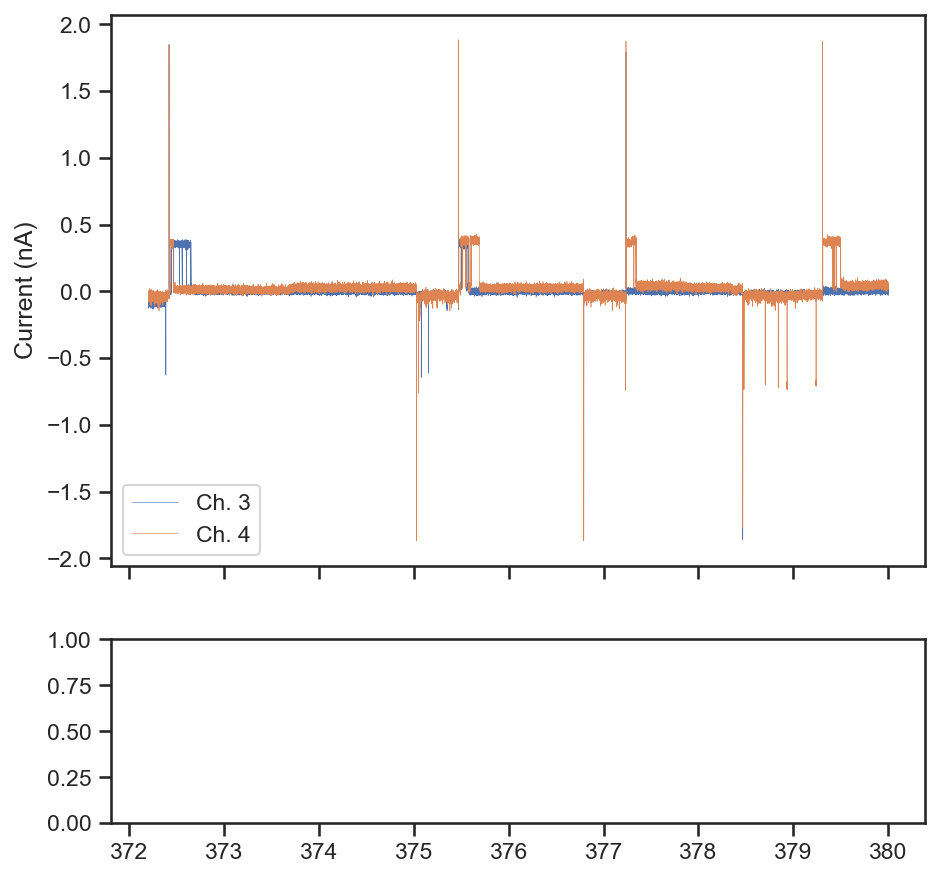

In [287]:
%matplotlib inline
plt.ion()
# plt.close('all')
tlim=np.array([372.2,380])
tidx=tlim*20000
tidx=tidx.astype(int)
fig,(ax0,ax1)=plt.subplots(2, 1,sharex=True,num=2345, gridspec_kw={'height_ratios': [3, 1]},
                               figsize=(7, 7),clear=True)
for i,tf in tqdm(enumerate(sfm.children[17:19]),total=2):
    print(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax0.plot(tf.t[tidx[0]:tidx[1]],tf.current[tidx[0]:tidx[1]]*1e9,lw=0.3,label=f"Ch. {i+3}")
    # for child in tf.traverse_to_rank("vstepgap"):
    #     ax1.plot([child.t[0],child.t[-1]],[child.get_feature("voltage")]*2,lw=0.6,c='k')
    # ax0.set_title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
ax0.set_ylim(-0.7,0.7)
ax0.set_ylabel("Current (nA)")
ax0.legend()
    # ax1.set_ylabel("Voltage (V)")


In [ ]:
%matplotlib inline
plt.ion()
# plt.close('all')
tlim=np.array([372.2,380])
tidx=tlim*20000
tidx=tidx.astype(int)
fig,(ax0,ax1)=plt.subplots(2, 1,sharex=True,num=2345, gridspec_kw={'height_ratios': [3, 1]},
                               figsize=(7, 7),clear=True)
for i,tf in tqdm(enumerate(sfm.children[17:19]),total=2):
    print(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax0.plot(tf.t[tidx[0]:tidx[1]],tf.current[tidx[0]:tidx[1]]*1e9,lw=0.3,label=f"Ch. {i+3}")
    # for child in tf.traverse_to_rank("vstepgap"):
    #     ax1.plot([child.t[0],child.t[-1]],[child.get_feature("voltage")]*2,lw=0.6,c='k')
    # ax0.set_title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
ax0.set_ylim(-0.7,0.7)
ax0.set_ylabel("Current (nA)")
ax0.legend()

In [ ]:
parser=


for tf in tqdm(sfm.children,total=len(sfm.children)):
    

In [ ]:
plt.close('all')
# plt.figure(1,figsize=(10,8),clear=True)
fig,axs=plt.subplots(2,1,figsize=(8,6),tight_layout=True,sharex=True)
t=np.arange(current.shape[0])/metadata["eff_sampling_freq"]
axs[0].plot(t,current/np.abs(voltage),lw=0.3)
axs[1].plot(t,voltage,lw=0.3)


In [ ]:
plt.close('all')
plt.figure(2,clear=True)
for child in tf.traverse_to_rank("vstepgap"):
    if -0.01<child.get_feature("voltage") <0.25:
        plt.plot(child.t,child.current,lw=0.3,c='k')

In [10]:
# tf=sfm.children[8]
# def __init__( self, sampling_freq, min_width=100, max_width=1000000, window_width=10000, 
        # min_gain_per_sample=None, false_positive_rate=None,
        # prior_segments_per_second=None, cutoff_freq=None ):
parser=SpeedyStatSplit(sampling_freq=tf.get_feature("metadata")["eff_sampling_freq"],min_width=10,max_width=1000000,window_width=100,
                       cutoff_freq=10000,min_gain_per_sample=0.8)#prior_segments_per_second=1,false_positive_rate=1e-35)


# plt.figure(55,clear=True)
for tf in sfm.children:
    for step in tf.traverse_to_rank("vstepgap"):
        voltage= step.get_feature("voltage")
        step.clear_children()
        if 0.01<voltage<0.251 and step.duration>1 and np.max(step.current)<1.5e-9 and np.min(step.current)>-1.5e-9:
            metasegs=parser.parse_meta(step.current.astype(np.double))
            print(len(metasegs),end=" ")
            for seg in metasegs:
                seg.parent=step
                seg.start+=step.start
                
                seg.end+=step.start
                
                seg.rank="vstepsegment"
            
            step.add_children(metasegs)
            
            # plt.plot(step.t,step.current,lw=0.3,c='k')
            # print(len(a))
            
            # print([seg.start+step.start for seg in a])
            # print([[seg.start for seg in a]])
            # plt.vlines([(seg.t[0]) for seg in step.children],ymin=-1e-9,ymax=1e-9,lw=0.4,colors='r')
            # break
    
    print("\n++++++++++++++++\n")
    # break
    # plt.show()

1 42 36 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 
++++++++++++++++

25 9 5 45 158 1 43 18 26 11 11 39 10 50 8 85 1 35 18 31 34 109 45 26 5 3 3 2 19 11 5 19 30 3 1 1 1 3 3 2 3 1 1 3 3 3 15 1 1 1 1 1 1 1 1 1 1 3 50 3 6 14 1 39 100 27 12 1 1 13 14 3 22 41 54 7 8 5 11 21 5 10 8 1 1 28 2 1 1 1 
++++++++++++++++

1 18 29 1 1 1 1 1 19 34 12 42 17 1 15 41 12 7 36 11 8 1 6 8 10 31 16 17 1 1 1 19 1 1 1 1 1 3 41 28 7 6 8 81 1 1 3 15 9 1 7 
++++++++++++++++

8 1 1 1 1 1 1 1 1 1 1 1 1 1 92 34 20 8 1 19 1 35 1 1 1 1 1 1 7 65 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 281 28 1 15 13 121 1 1 1 1 1 1 1 1 12 67 1 146 1 1 1 89 7 53 136 18 1 24 102 1 192 1 1 49 54 1 
++++++++++++++++

4 30 5 1 1 1 1 3 1 1 1 1 1 1 222 2 1 3 1 1 1 1 2 1 1 1 1 1 14 2 66 2 35 1 14 146 119 2 4 2 1 2 1 7 3 9 1 3 7 10 1 1 1 1 10 1 1 1 1 1 1 1 1 22 23 9 6 13 15 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 1 1 1 1 
++++++++++++++++

1 1 1 1 1 1 

In [14]:
examples={
    "Hexamer":{"tf": sfm.children[1], "starts":[354], "ends":[458]},
    "Heptamer_fw":{"tf":sfm.children[17] , "starts":[105.7], "ends":[310.5]},
    "Heptamer_rev":{"tf":sfm.children[12] , "starts":[6], "ends":[244]},
}

In [15]:
%matplotlib ipympl
plt.close('all')
import numpy.ma as ma
from PythIon.parsers.parsers import lambda_event_parser

color_map={0.125:"tab:grey",0.150:"tab:blue",0.175:"tab:green",0.200:"tab:orange",0.225:"tab:red",0.250:"tab:purple"}
def parse(tf,starts,ends,voltage_range=(0.149,0.251),threshold=0.5):
    steps=set()
    for step in tf.traverse_to_rank("vstepgap"):
        for start,end in zip(starts,ends):
            if start<step.t[0] and step.t[-1]<end and voltage_range[0]<step.get_feature("voltage")<voltage_range[1]:
                steps.add(step)
    if len(steps)==0:
        return
    steps=list(steps)
    # plt.figure()
    ti=0
    results=[]
    for step in steps:
        # plt.plot(step.t,step.current,c='k',lw=0.4)
        mask=np.where(step.current>100e-12,1,0)
        masked_current=ma.masked_array(step.current,mask)
        
        hist,edges=np.histogram(masked_current,bins=120,range=(100e-12,600e-12))
        centers=edges[:-1]+(edges[1]-edges[0])*0.5
        I0guess=centers[np.argmax(hist)]
        Ithresh=I0guess*threshold
        if I0guess<130e-12:
            continue
        eventmask=np.where(step.current<Ithresh,1,0)
        lambda_parser=lambda_event_parser(threshold=Ithresh,rules=[lambda event:event.mean<I0guess*0.3,lambda event:event.duration>4])
        
        events=lambda_parser.parse(step.current)
        if len(events)==0:
            continue
        for i in range(len(events)):
            
            if i==len(events)-1:
                bstart=events[i].start+events[i].duration
                bend=step.current.shape[0]
                
            else:
                bstart=events[i].start+events[i].duration
                bend=events[i+1].start
                # baseline=step.current[events[i].start+events[i].duration:events[i+1].start]
            baseline=step.current[bstart:bend]
            events[i].I0=np.median(baseline,axis=-1)
            if events[i].I0<0.5e-10:
                print(baseline*1e9,bstart,bend)
                # event.I0=np.median(step.current[])
        if events[-1].start+events[-1].duration==step.current.shape[0]:
            events.pop(-1)     
        if len(events)==0:
            continue  
        if events[0].start==0:
            events.pop(0)   
        for event in events:
            wstart=max(event.start-50,0)
            wend=min(event.start+event.duration+50,step.current.shape[0])
            # print(wstart,wend)
            event.wrap=step.current[wstart:wend]   
        for event in events:
            event.duration=1/20000*event.current.shape[0]
            event.voltage=step.get_feature("voltage")
            # if np.log10(event.duration)>-4:
            #     continue
            # t=np.arange(event.current.shape[0])/20000+ti
            # # plt.plot(t,event.current,lw=0.4)
            # # plt.plot(t,[I0guess]*t.shape[0])
            # ti+=event.duration+0.005
        
        
        color=color_map[round(float(step.get_feature("voltage")),3)]
        results+=events
        # plt.scatter([I0guess]*len(events),[np.log10(event.duration) for event in events],c=color,s=4)
        # print([np.mean([np.log10(event.duration) for event in events],axis=-1)])
        # plt.scatter([I0guess],[np.median([np.log10(event.duration) for event in events],axis=-1)],marker="*",s=10,c='r')
        # plt.hist2d([I0guess]*len(events),[np.log10(event.duration) for event in events],range=[ [1e-10,5e-10],[-3.5,1]],bins=(40,20),norm='log')
        # plt.scatter([np.log10(event.duration) for event in events],[1-event.mean/event.I0 for event in events],c=color,s=4)
        
    # plt.xlim(0.6,1)
    # plt.ylim(-4,1)
        # plt.plot(centers,hist)
        
    return results
dfs={}
for key,example in examples.items(): 
    events=parse(**example)   
    dfs[key]=pd.DataFrame(columns=['mean','frac','dwell','baseline','Voltage','current','wrap'])
    for event in events:
        dfdict={"mean":event.mean,
                "frac":1-event.mean/event.I0,
                "dwell":event.duration,
                "baseline":event.I0,
                "Voltage":int(1000*round(float(event.voltage),3)),
            "current":event.current,
            "wrap":event.wrap}
        dfs[key].loc[len(dfs[key])]=dfdict
    

c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  

In [12]:
with open("ignored_files.csv",'a') as bad_files:
    for tf in sfm.children:
        total_steps=len(tf.traverse_to_rank("vstepsegment"))
        if total_steps<150:
            bad_files.write(f'{os.path.relpath(tf.get_feature("metadata")["HeaderFile"][4:])}, {total_steps}\n')

            

In [135]:
dfs["Heptamer_fw"].head()

,mean,frac,dwell,baseline,voltage,current,wrap
0,2.349954e-11,0.891029,0.00625,2.156504e-10,0.15,"[2.4411567e-11, 4.3379862e-11, 2.7857164e-11, ...","[2.1155058e-10, 2.1876506e-10, 2.2092829e-10, ..."
1,1.948103e-11,0.909674,0.00285,2.156754e-10,0.15,"[1.7919308e-11, 1.9930288e-11, 2.0849761e-11, ...","[2.1780598e-10, 2.3389396e-10, 2.1358604e-10, ..."
2,2.693323e-11,0.874723,0.00955,2.149890e-10,0.15,"[9.152198e-11, 2.0139659e-11, 2.4141744e-11, 2...","[2.1973624e-10, 2.1487205e-10, 2.1007594e-10, ..."
3,1.701782e-11,0.920813,0.00495,2.149068e-10,0.15,"[2.5390766e-11, 3.2154e-11, 3.0783622e-11, 2.7...","[2.1288597e-10, 2.1637223e-10, 2.142288e-10, 2..."
4,2.091900e-11,0.902260,0.00385,2.140267e-10,0.15,"[-7.6420917e-13, 2.659585e-11, 2.0432565e-11, ...","[2.218305e-10, 2.2381541e-10, 2.1916716e-10, 2..."


['175' '200' '225']


c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\utils.py:482: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda

['150' '200' '175']


c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\utils.py:482: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda

['200' '225' '175']


c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\utils.py:482: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\alito\.conda

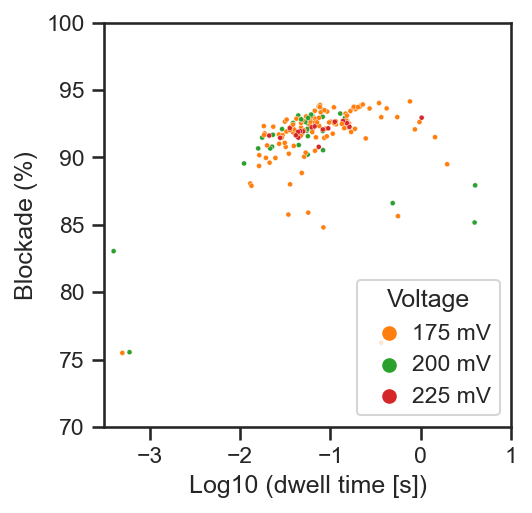

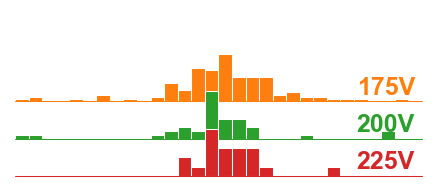

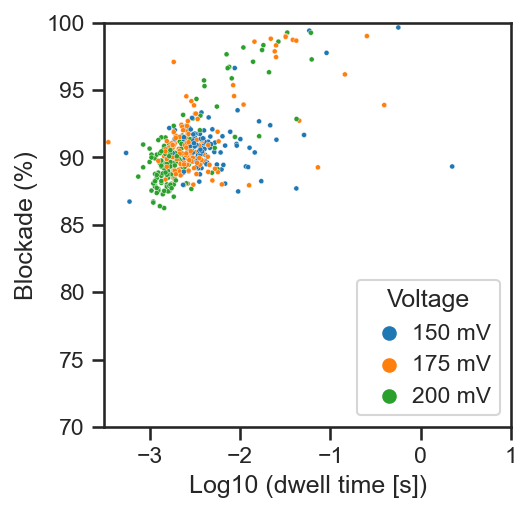

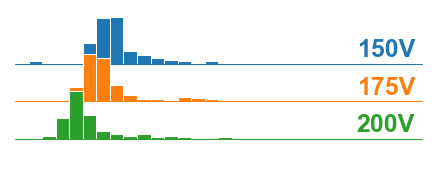

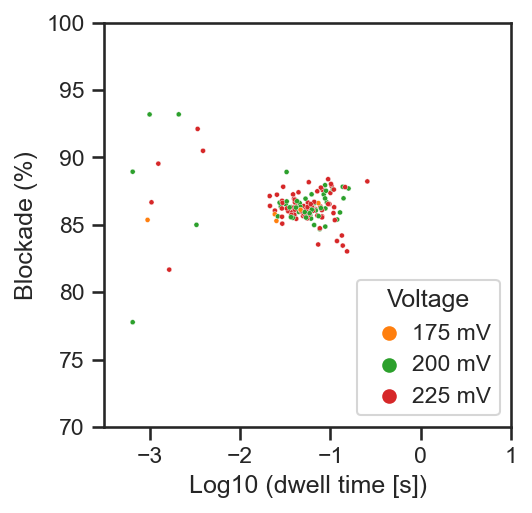

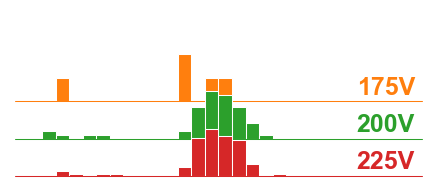

In [235]:
%matplotlib inline
hueorder=[150,175,200,225]
hueorder=list(map(str,hueorder))
mpl.rcParams['pdf.fonttype'] = 42
# matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["pdf.use14corefonts"] = False
plt.rcParams["font.family"]=["Arial"]
plt.rcParams["ps.useafm"] = True
plt.rcParams["figure.dpi"]=150
for key,df in dfs.items():
    # sns.set_theme("white")
    
    sns.set_style("ticks")
    df["logdwell"]=np.log10(df["dwell"])
    df["fracpct"]=np.multiply(df["frac"],100)
    df["voltagestr"]=df["Voltage"].astype(str)
    print(df["voltagestr"].unique())
    plt.figure(key,figsize=(3.5,3.5))
    palette=sns.color_palette("tab10", 4)
    ax=sns.scatterplot(df,x="logdwell",y='fracpct',hue='voltagestr',palette=palette,hue_order=hueorder,s=6)
    handles,labels=ax.get_legend_handles_labels()
    
    sns.move_legend(ax,loc="lower right",title="Voltage",handles=handles,labels=[str(x)+" mV" if x in df["voltagestr"].unique() else "_" for x in labels ],handletextpad=0)
    plt.ylim(70,100)
    plt.xlim(-3.5,1)
    plt.ylabel("Blockade (%)")
    plt.xlabel("Log10 (dwell time [s])")
    plt.savefig(f"{key}_scatter.pdf")
    
    
    
    sns.set_theme(style='white', rc={"axes.facecolor": (0, 0, 0, 0)})
    binrange=[-3.5,1]
    binwidth=0.15
    bin_count=int((binrange[1]-binrange[0])/binwidth)
    # g = sns.FacetGrid(_df, row="Voltage (V)",row_order=hueorder, hue="Voltage (V)", hue_order=hueorder, aspect=8, height=.5,sharey=False,sharex=True, palette='rainbow',xlim=binrange)
    # g.map(sns.histplot, "frac",
    #   binwidth=binwidth,binrange=binrange, clip_on=True,
    #   fill=True, alpha=1, linewidth=0.45,common_norm=True,log_scale=(False,True))
    # plt.figure()
    
    g = sns.FacetGrid(df, row="voltagestr",row_order=hueorder, hue="voltagestr", hue_order=hueorder, 
                      aspect=10, height=.35,sharey=False,sharex=True, palette=palette,xlim=binrange)
    g.map(sns.histplot, "logdwell",
      binwidth=binwidth,binrange=binrange, clip_on=True,
      fill=True, alpha=1, linewidth=0.5,common_norm=True,hue_norm=(150,225))
    g.refline(y=0, linewidth=0.5, linestyle="-", color=None, clip_on=False)
    
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0.84, .28, label+"V", fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)
    g.map(label,'logdwell')
    g.figure.subplots_adjust(hspace=-0.25)
    g.set_titles("")
    g.set(yticks=[],xticks=[], ylabel="",xlabel="")
    g.despine(bottom=True, left=True)
    g.figure.savefig(f"{key}_dwell_hist.pdf")
    # print(g.axes.shape)
    # g.axes[3,0].tick_params(axis='x',reset=True,top=False)
    # g.refline(y=0.8, linewidth=0.4, linestyle="-", color=None, clip_on=False)
    

In [16]:

for key,df in dfs.items():
    df["pore"]=key
    
dfjoint=pd.concat(dfs.values())


c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\utils.py:482: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)


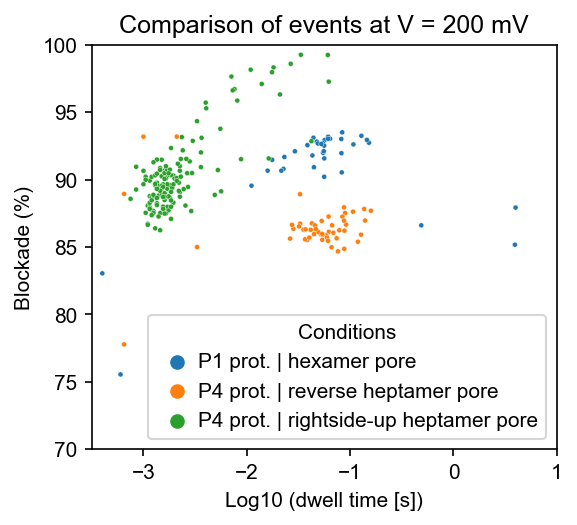

In [29]:
%matplotlib inline
hueorder=["Hexamer","Heptamer_rev","Heptamer_fw"]
hueorder=list(map(str,hueorder))
mpl.rcParams['pdf.fonttype'] = 42
# matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["pdf.use14corefonts"] = False
plt.rcParams["font.family"]=["Arial"]
plt.rcParams["ps.useafm"] = True
plt.rcParams["figure.dpi"]=150
plt.figure("scatters_200mV",figsize=(4,3.5))
dfjoint["logdwell"]=np.log10(dfjoint["dwell"])
dfjoint["fracpct"]=np.multiply(dfjoint["frac"],100)
dfjoint["voltagestr"]=dfjoint["Voltage"].astype(str)
palette=sns.color_palette("tab10", 3)
ax=sns.scatterplot(dfjoint.loc[dfjoint["voltagestr"]=='200'],x="logdwell",y='fracpct',hue='pore',palette=palette,hue_order=hueorder,s=6)
plt.ylim(70,100)
plt.xlim(-3.5,1)
plt.ylabel("Blockade (%)")
plt.xlabel("Log10 (dwell time [s])")
handles,labels=ax.get_legend_handles_labels()
    
sns.move_legend(ax,loc="lower right",title="Conditions",handles=handles,labels=["P1 prot. | hexamer pore","P4 prot. | reverse heptamer pore","P4 prot. | rightside-up heptamer pore"],handletextpad=0)
plt.title("Comparison of events at V = 200 mV")
plt.savefig(f"joint_scatter.pdf")

# for key,df in dfs.items():
#     # sns.set_theme("white")
    
#     sns.set_style("ticks")
#     df["logdwell"]=np.log10(df["dwell"])
#     df["fracpct"]=np.multiply(df["frac"],100)
#     df["voltagestr"]=df["Voltage"].astype(str)
#     print(df["voltagestr"].unique())
    
#     palette=sns.color_palette("tab10", 4)
#     ax=sns.scatterplot(df,x="logdwell",y='fracpct',hue='voltagestr',palette=palette,hue_order=hueorder,s=6)
#     handles,labels=ax.get_legend_handles_labels()
    
#     sns.move_legend(ax,loc="lower right",title="Voltage",handles=handles,labels=[str(x)+" mV" if x in df["voltagestr"].unique() else "_" for x in labels ],handletextpad=0)
#     plt.ylim(70,100)
#     plt.xlim(-3.5,1)
#     plt.ylabel("Blockade (%)")
#     plt.xlabel("Log10 (dwell time [s])")
#     plt.savefig(f"{key}_scatter.pdf")
    
    
    
#     sns.set_theme(style='white', rc={"axes.facecolor": (0, 0, 0, 0)})
#     binrange=[-3.5,1]
#     binwidth=0.15
#     bin_count=int((binrange[1]-binrange[0])/binwidth)
#     # g = sns.FacetGrid(_df, row="Voltage (V)",row_order=hueorder, hue="Voltage (V)", hue_order=hueorder, aspect=8, height=.5,sharey=False,sharex=True, palette='rainbow',xlim=binrange)
#     # g.map(sns.histplot, "frac",
#     #   binwidth=binwidth,binrange=binrange, clip_on=True,
#     #   fill=True, alpha=1, linewidth=0.45,common_norm=True,log_scale=(False,True))
#     # plt.figure()
    
#     g = sns.FacetGrid(df, row="voltagestr",row_order=hueorder, hue="voltagestr", hue_order=hueorder, 
#                       aspect=10, height=.35,sharey=False,sharex=True, palette=palette,xlim=binrange)
#     g.map(sns.histplot, "logdwell",
#       binwidth=binwidth,binrange=binrange, clip_on=True,
#       fill=True, alpha=1, linewidth=0.5,common_norm=True,hue_norm=(150,225))
#     g.refline(y=0, linewidth=0.5, linestyle="-", color=None, clip_on=False)
    
#     def label(x, color, label):
#         ax = plt.gca()
#         ax.text(0.84, .28, label+"V", fontweight="bold", color=color,
#             ha="left", va="center", transform=ax.transAxes)
#     g.map(label,'logdwell')
#     g.figure.subplots_adjust(hspace=-0.25)
#     g.set_titles("")
#     g.set(yticks=[],xticks=[], ylabel="",xlabel="")
#     g.despine(bottom=True, left=True)
#     g.figure.savefig(f"{key}_dwell_hist.pdf")
#     # print(g.axes.shape)
#     # g.axes[3,0].tick_params(axis='x',reset=True,top=False)
#     # g.refline(y=0.8, linewidth=0.4, linestyle="-", color=None, clip_on=False)
    

c:\Users\alito\.conda\envs\pydev311\Lib\site-packages\seaborn\utils.py:482: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)


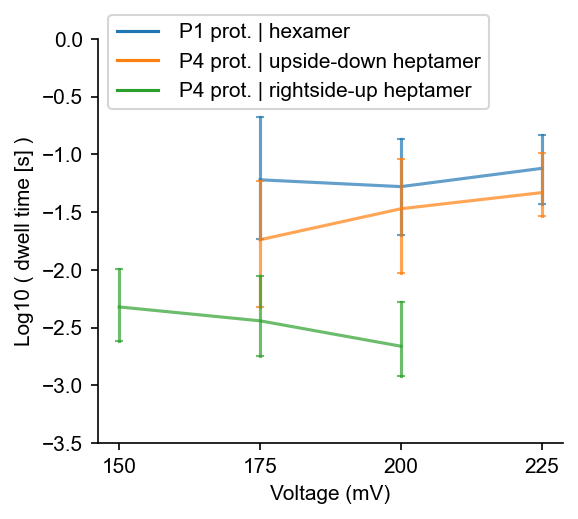

In [71]:
%matplotlib inline
hueorder=["Hexamer","Heptamer_rev","Heptamer_fw"]
hueorder=list(map(str,hueorder))
mpl.rcParams['pdf.fonttype'] = 42
# matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["pdf.use14corefonts"] = False
plt.rcParams["font.family"]=["Arial"]
plt.rcParams["ps.useafm"] = True
plt.rcParams["figure.dpi"]=150
plt.figure("scatters_200mV",figsize=(4,3.5))
dfjoint["logdwell"]=np.log10(dfjoint["dwell"])
dfjoint["fracpct"]=np.multiply(dfjoint["frac"],100)
dfjoint["voltagestr"]=dfjoint["Voltage"].astype(str)
palette=sns.color_palette("tab10", 3)

# sns.lineplot(dfjoint.loc[~((dfjoint["pore"]=="Heptamer_rev")&(dfjoint["logdwell"]<-3)&(dfjoint["Voltage"]==175))],x="Voltage",y="logdwell",hue="pore",hue_order=hueorder,err_style="bars",errorbar='sd',markers=True)
ax=sns.lineplot(dfjoint,x="Voltage",y="logdwell",hue="pore",hue_order=hueorder,err_style="bars",errorbar=('pi',75),err_kws={"capsize":2},alpha=0.7,markers=True)

# ax=sns.scatterplot(dfjoint.loc[dfjoint["voltagestr"]=='200'],x="logdwell",y='fracpct',hue='pore',palette=palette,hue_order=hueorder,s=6)
plt.ylim(-3.5,0)
# plt.xlim(-3.5,1)
plt.ylabel("Log10 ( dwell time [s] )")
plt.xticks([150,175,200,225])
plt.xlabel("Voltage (mV)")
handles,labels=ax.get_legend_handles_labels()
    
sns.move_legend(ax,loc="lower left",bbox_to_anchor=(.0, 0.8),title=None,handles=handles,labels=["P1 prot. | hexamer","P4 prot. | upside-down heptamer","P4 prot. | rightside-up heptamer"],handletextpad=1)
# plt.title("Comparison of events at V = 200 mV",pad=0.7)
sns.despine(ax=ax,top=True,right=True)
plt.savefig(f"dwell_trends.pdf")

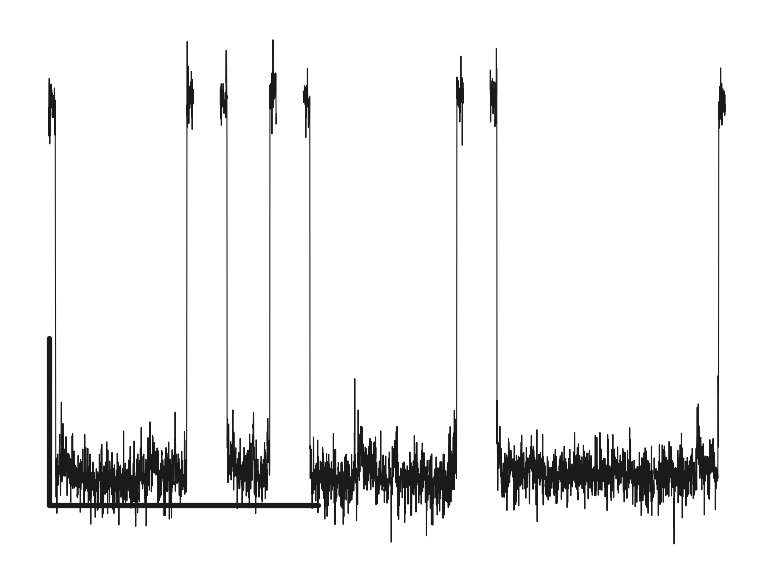

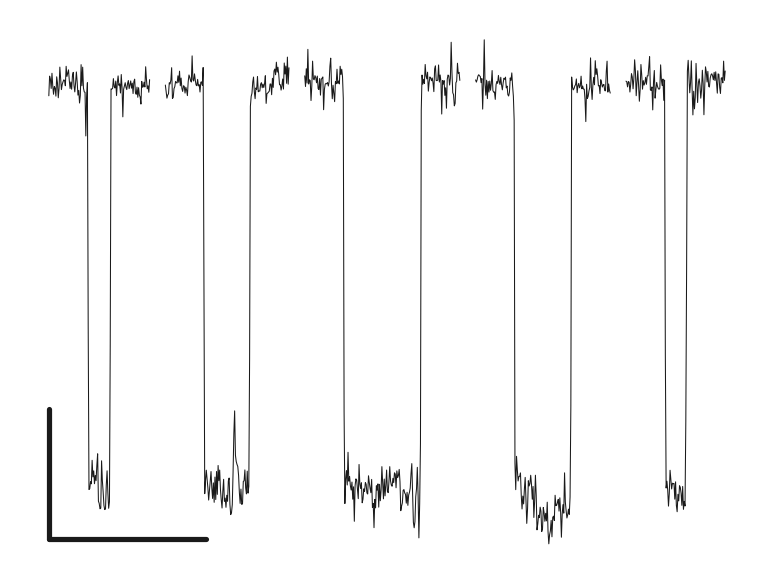

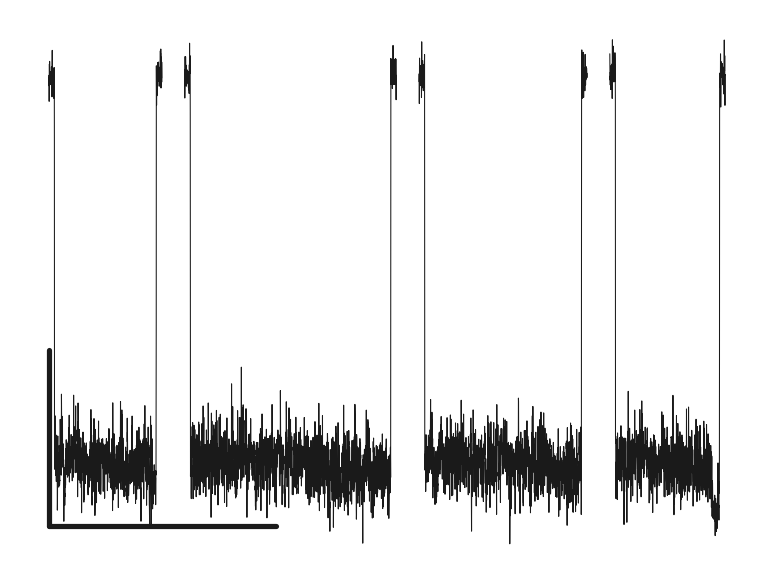

In [274]:
selected_events={"Hexamer":[4,6,7,15],
                 "Heptamer_fw":[40,42,56,44,57],
                 "Heptamer_rev":[40,43,46,48]}
gaps={"Hexamer":0.01,
                 "Heptamer_fw":0.001,
                 "Heptamer_rev":0.01}

for key,df in dfs.items():
    plt.figure(key,clear=True)
    sns.set_theme(style='ticks')
    _df=df.loc[df["Voltage"]==200]
    # print(_df.head(20))
    t0=0
    for idx in selected_events[key]:
        t=t0+np.arange(len(_df.at[idx,"wrap"]))/20000
        
        plt.plot(t,_df.at[idx,"wrap"]*1e9,c='k',lw=0.5 )
        t0=t[-1]+gaps[key]
    plt.plot([0,0],[0,0.1],c='k',lw=2.5)
    plt.plot([0,10*gaps[key]],[0,0],c='k',lw=2.5)
    ax=plt.gca()
    # ax.spines[['right', 'top','bottom']].set_visible(False)
    ax.set_axis_off()
    plt.savefig(f"{key}_events.pdf",bbox_inches='tight')
    


In [12]:
# %matplotlib ipympl

  0%|          | 0/14 [00:00<?, ?it/s]

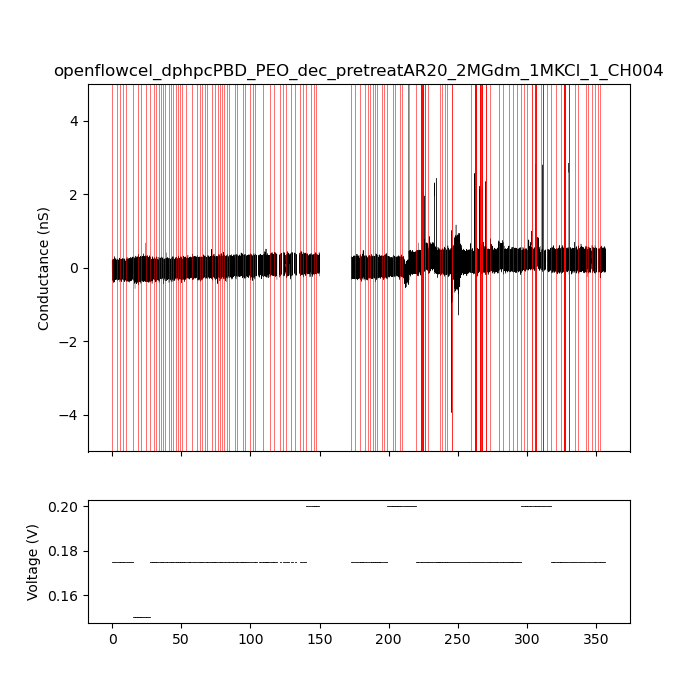

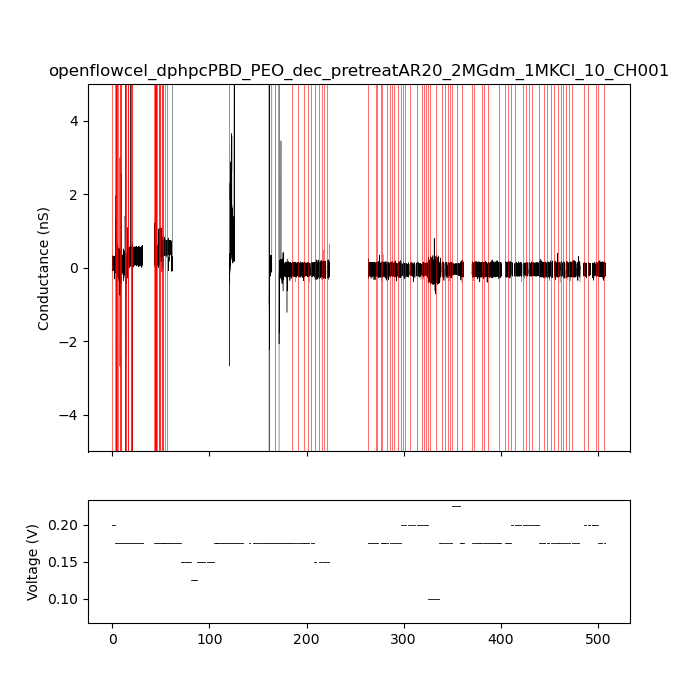

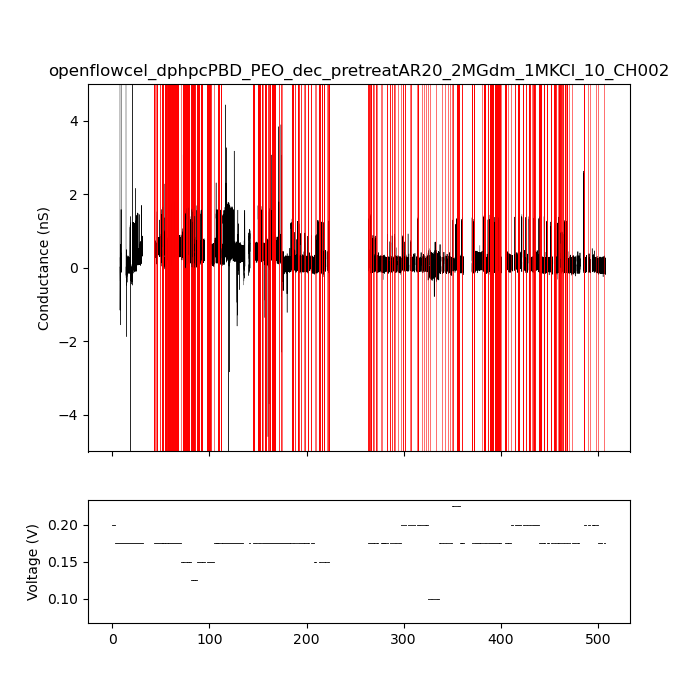

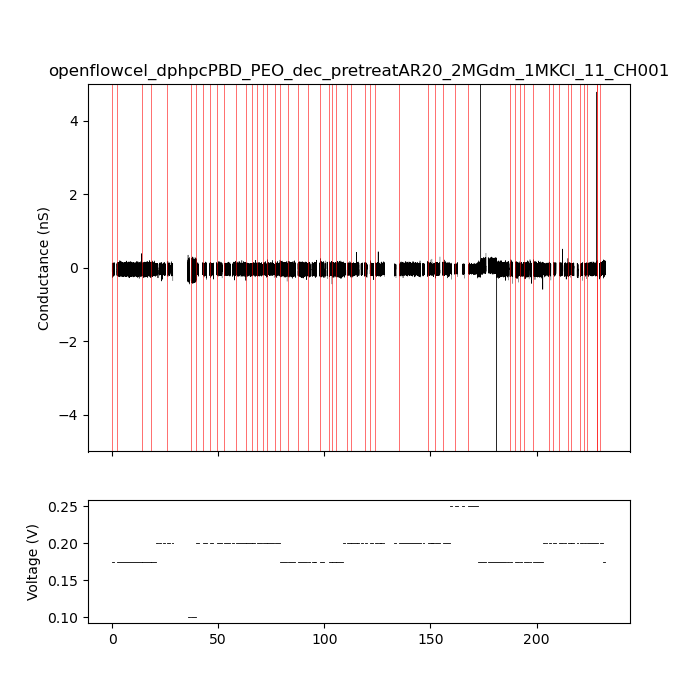

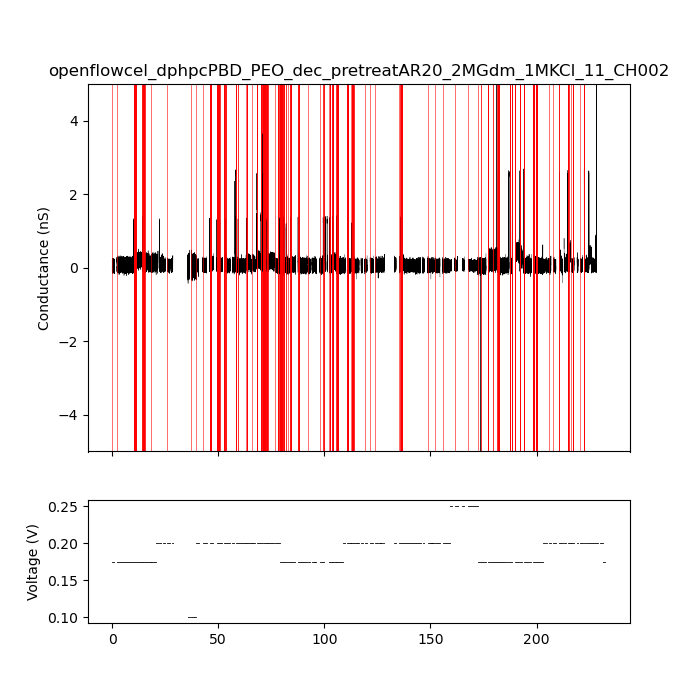

...

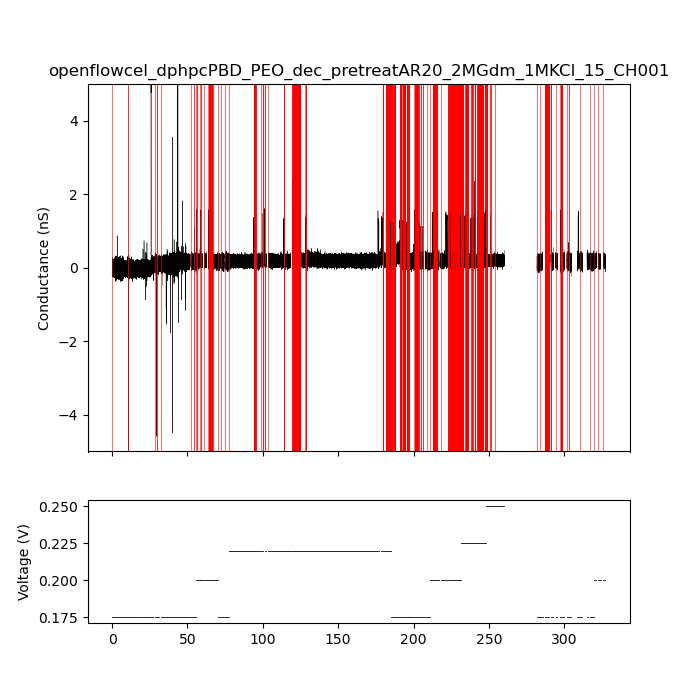

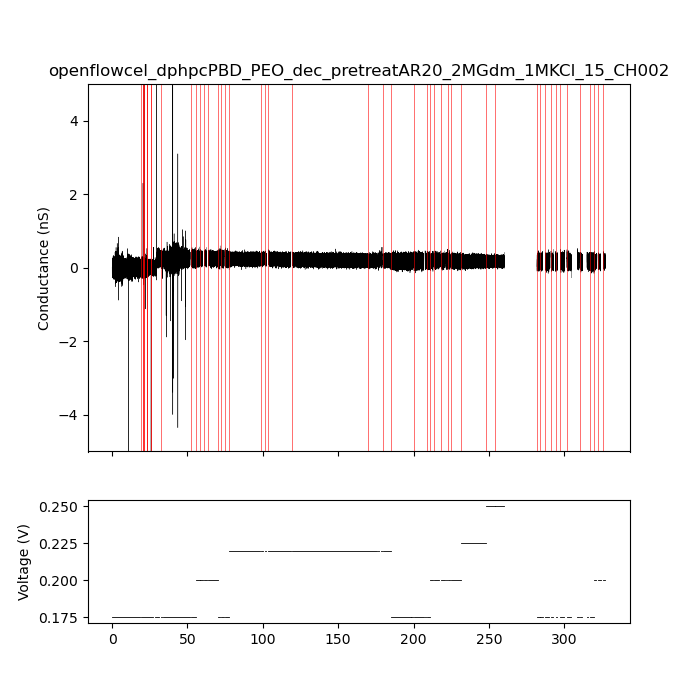

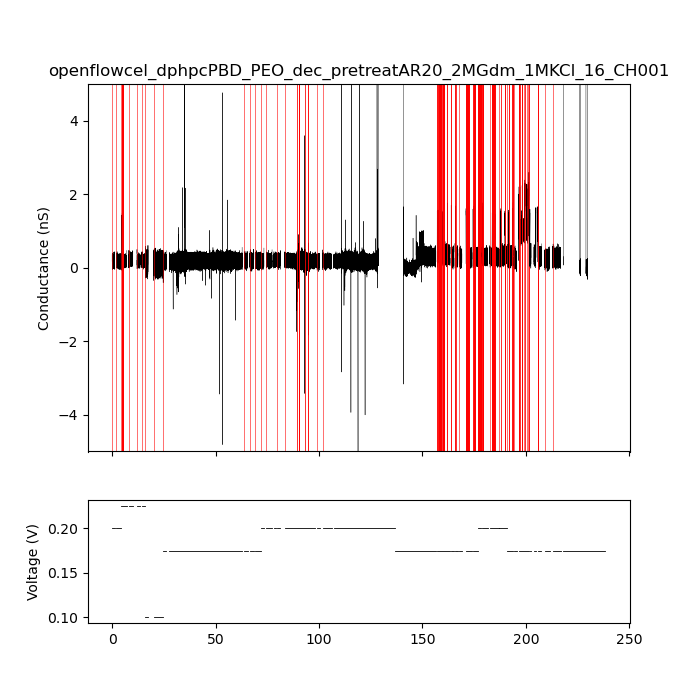

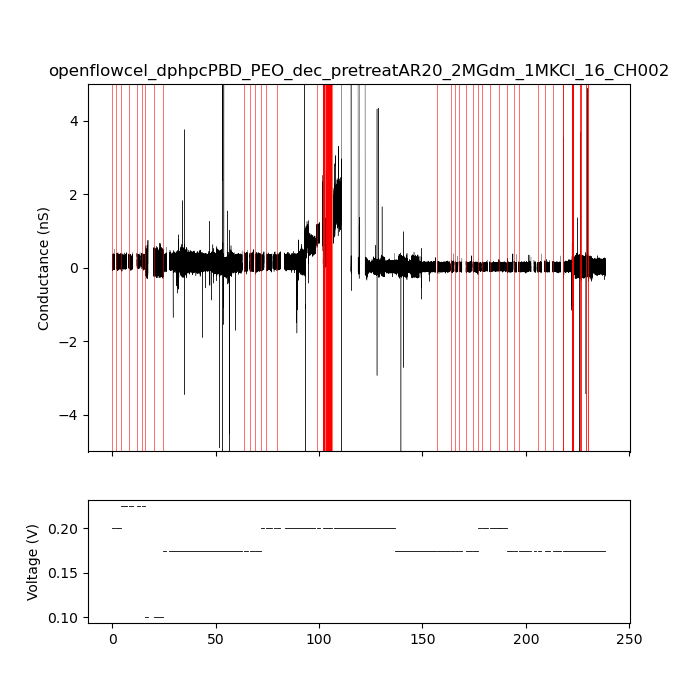

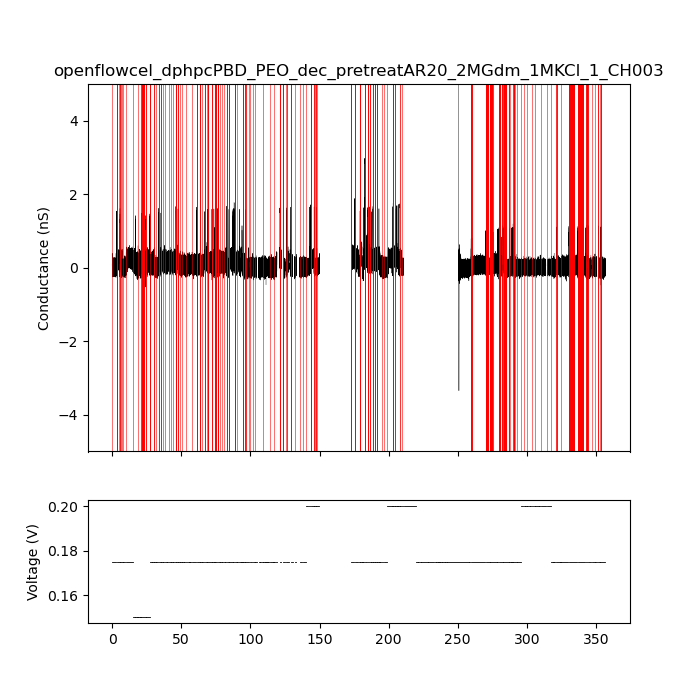

In [78]:
# plt.ioff()
plt.close('all')
for i,tf in tqdm(enumerate(sfm.children),total=len(sfm.children)):
    fig,(ax0,ax1)=plt.subplots(2, 1,sharex=True,num=i+1, gridspec_kw={'height_ratios': [3, 1]},
                               figsize=(7, 7))
    for child in tf.traverse_to_rank("vstepgap"):
        if 0.01<child.get_feature("voltage") <0.251:
            ax0.plot(child.t,child.current*1e9/child.get_feature("voltage"),lw=0.3,c='k')
            ax1.plot([child.t[0],child.t[-1]],[child.get_feature("voltage")]*2,lw=0.6,c='k')
        ax0.vlines([(seg.t[0]) for seg in child.children],ymin=-5,ymax=5,lw=0.4,colors='r')
    ax0.set_title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax0.set_ylim(-5,5)
    ax0.set_ylabel("Conductance (nS)")
    ax1.set_ylabel("Voltage (V)")

plt.ion()
plt.show()

In [ ]:

dummy_signal= [step for step in sfm.children[4].traverse_to_rank("vstepgap") if 182.7<step.t[0]<183][0]

In [6]:
%matplotlib ipympl

C:\Users\alito\AppData\Local\Temp\ipykernel_56268\2400688171.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i+100)


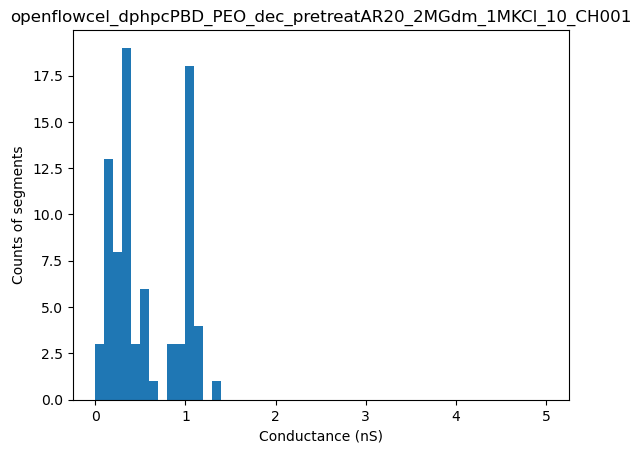

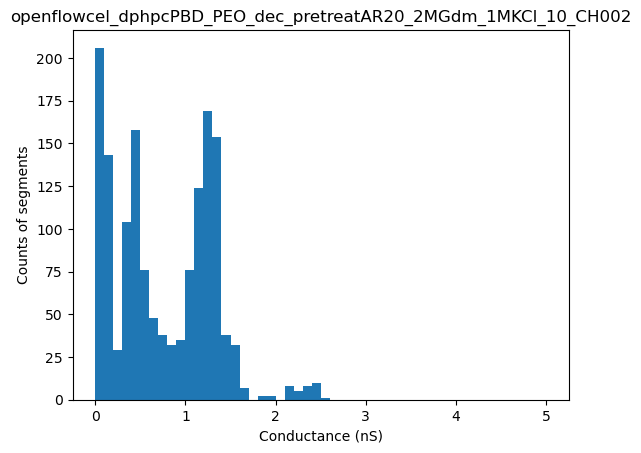

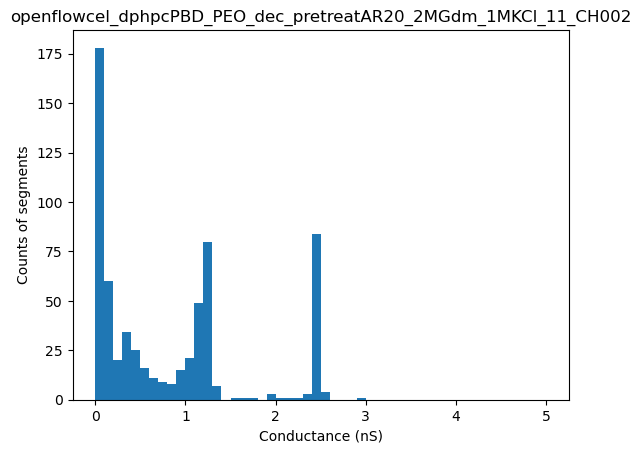

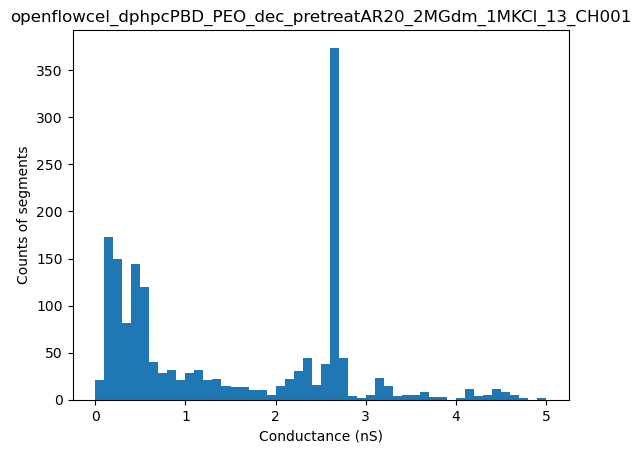

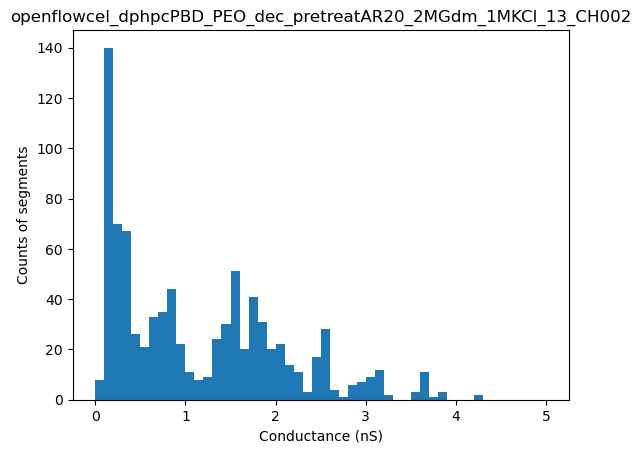

...

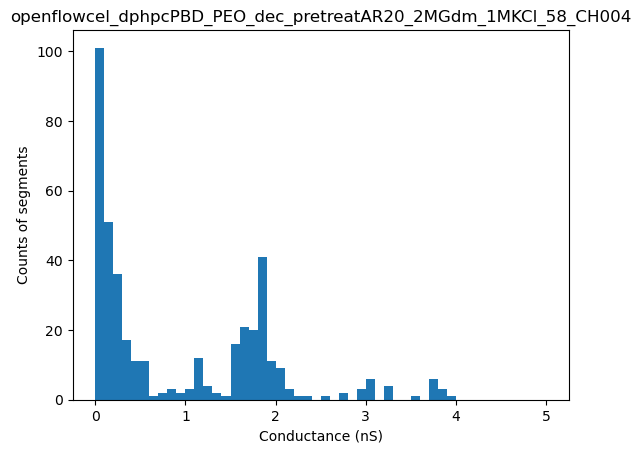

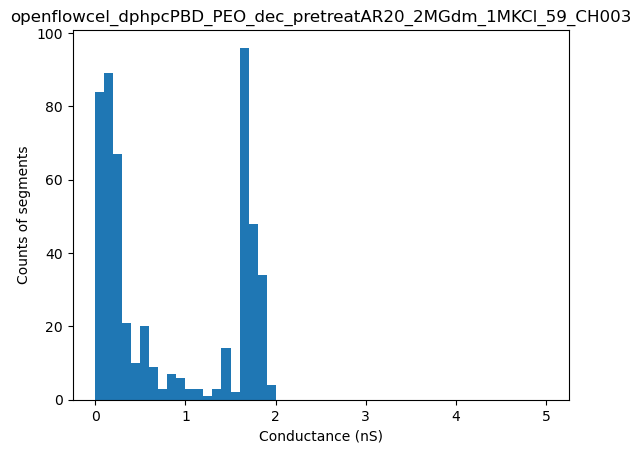

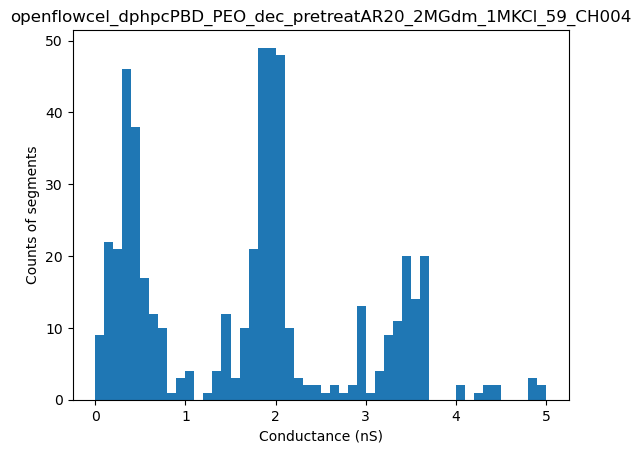

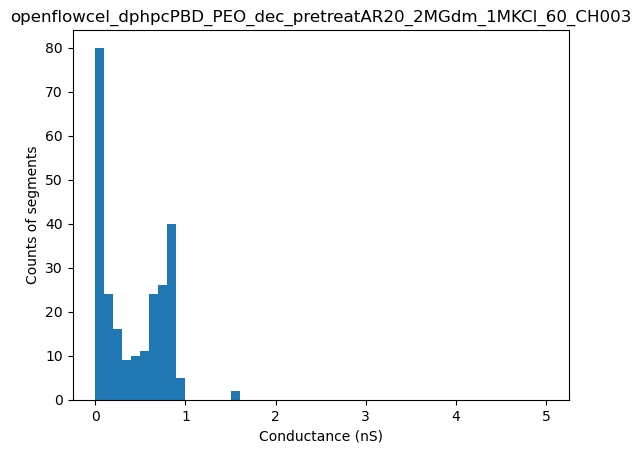

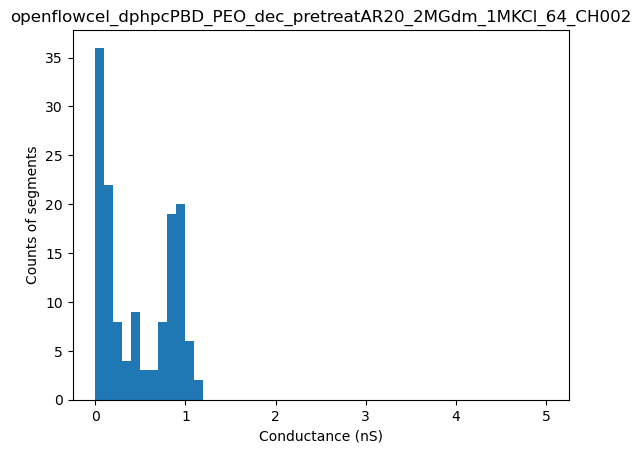

In [9]:
# plt.close('all')

for i,tf in enumerate(sfm.children):
    plt.figure(i+100)
    gs=[]
    for seg in tf.traverse_to_rank("vstepsegment"):
        c=seg.mean*1e9
        # std=seg.std
        v=seg.get_feature("voltage")
        g=c/v
        gs.append(g)
    plt.hist(gs,bins=np.linspace(0,5,51))
    plt.title(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    plt.xlabel("Conductance (nS)")
    plt.ylabel("Counts of segments")
    
    

dict_keys([0.125, 0.15, 0.175, 0.2, 0.225, 0.25])


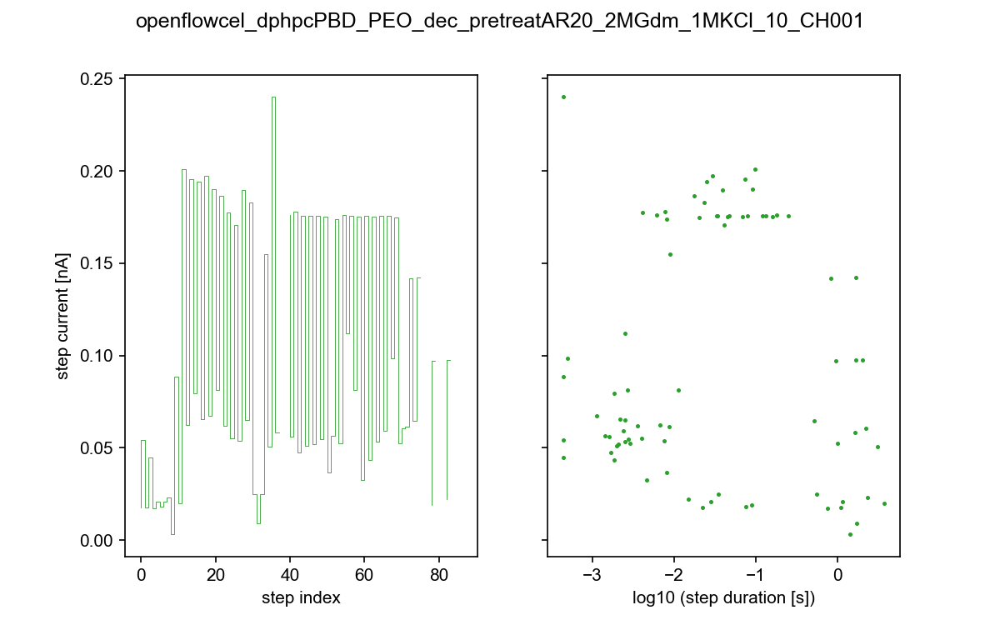

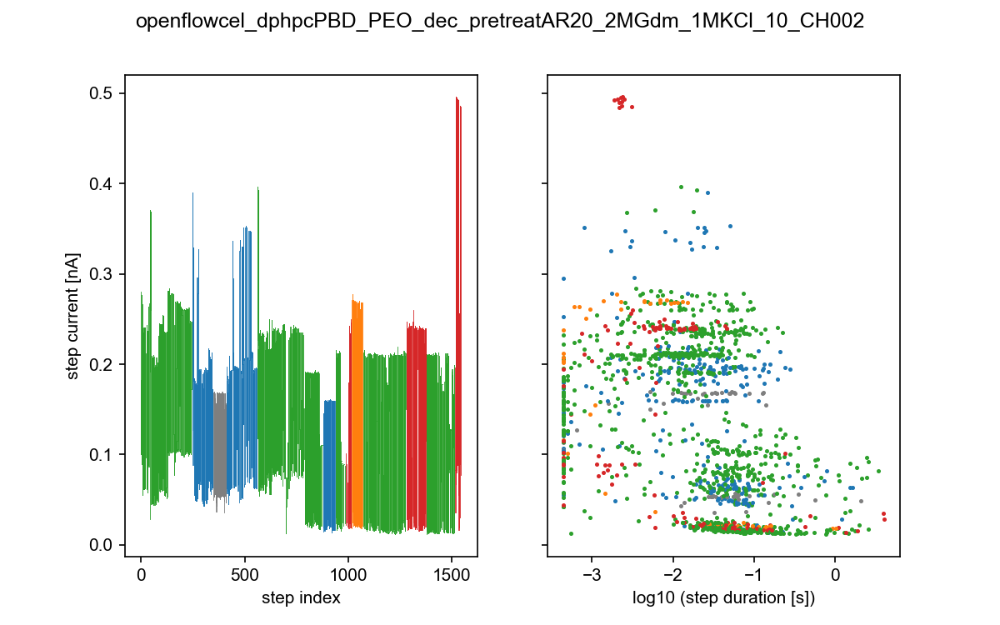

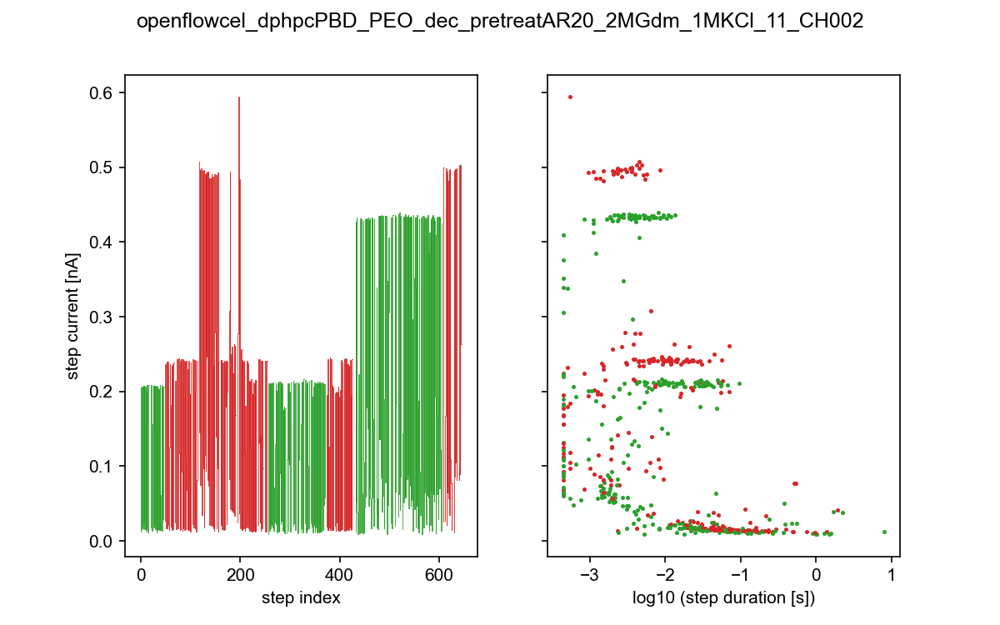

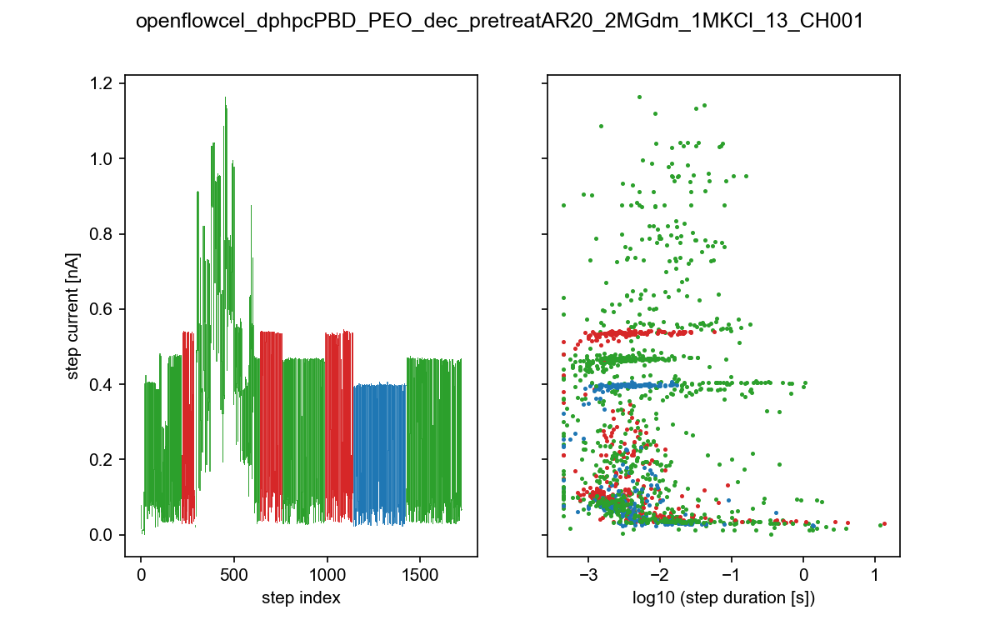

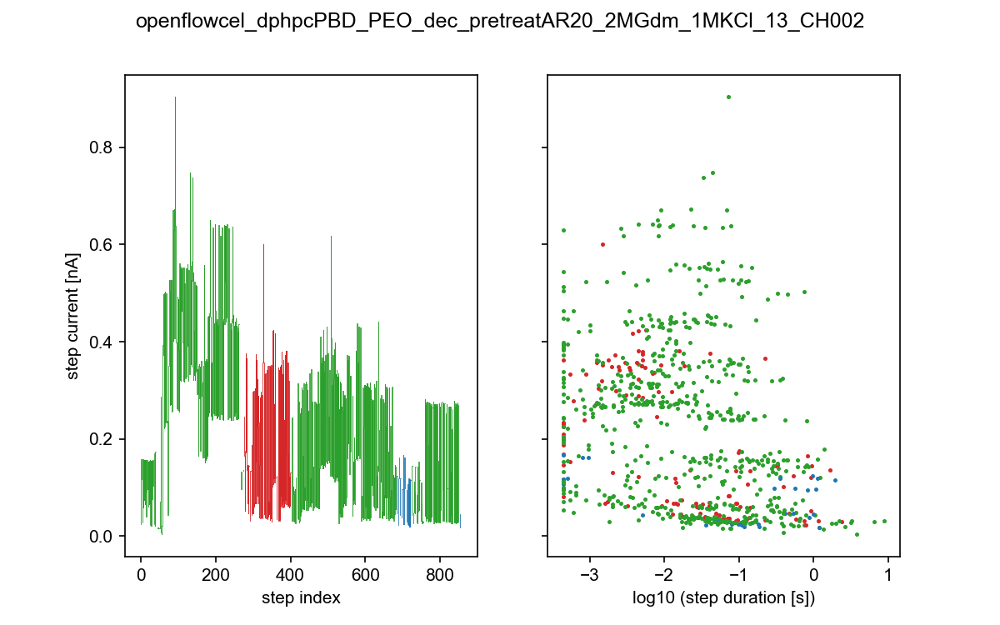

...

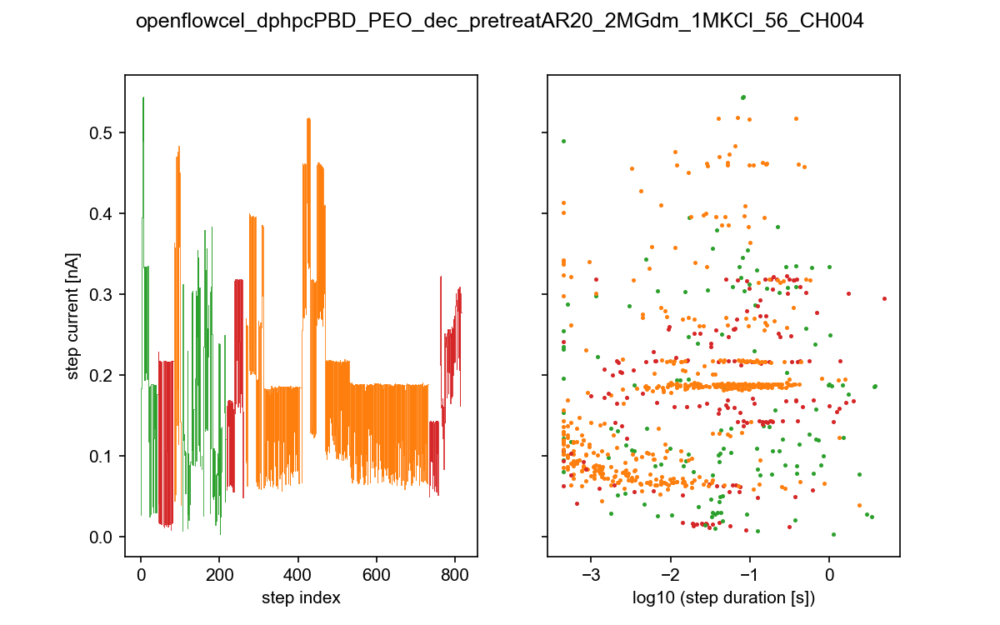

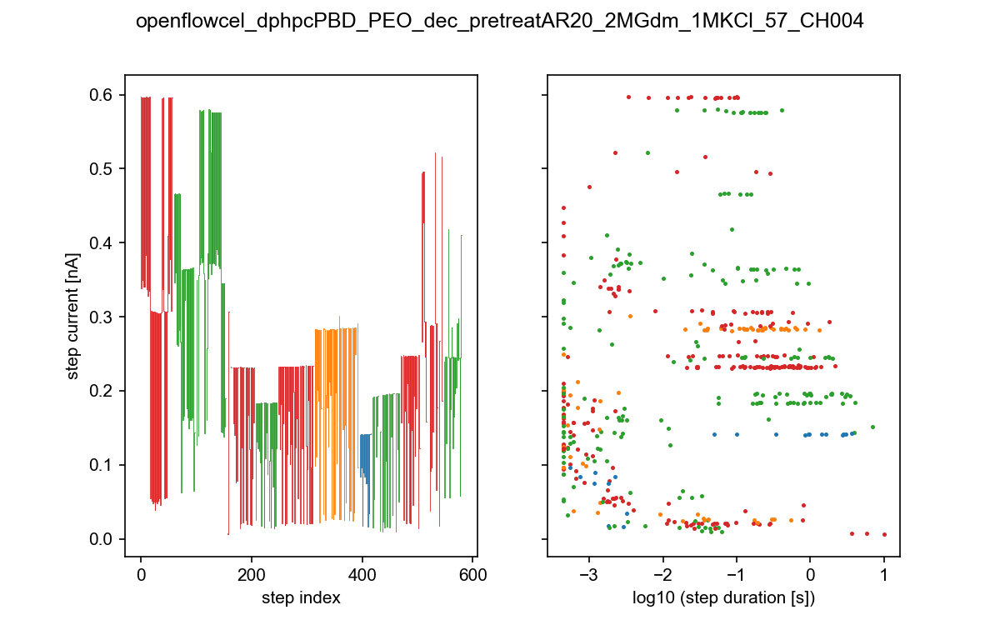

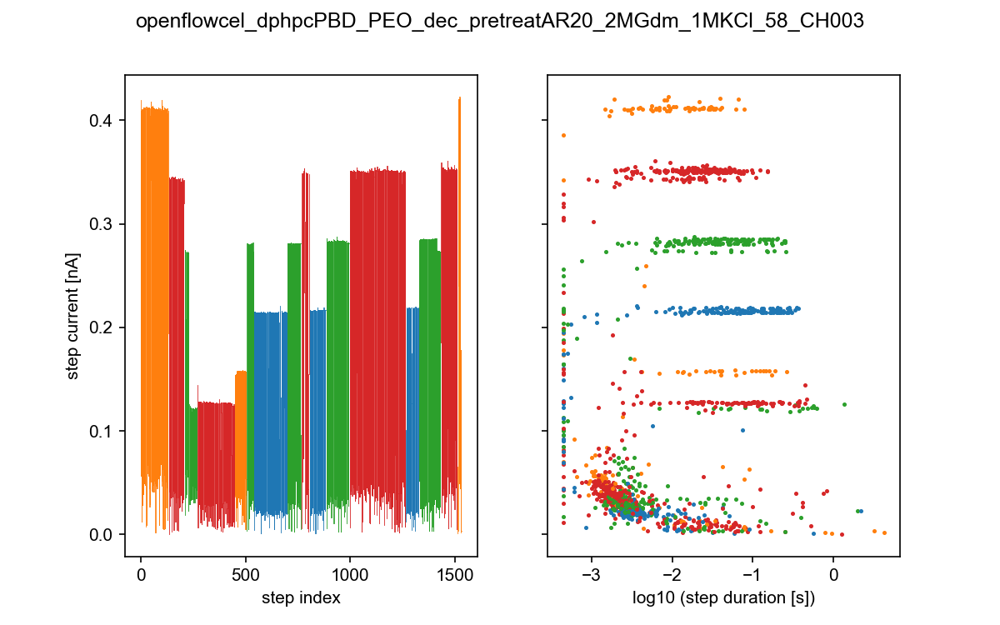

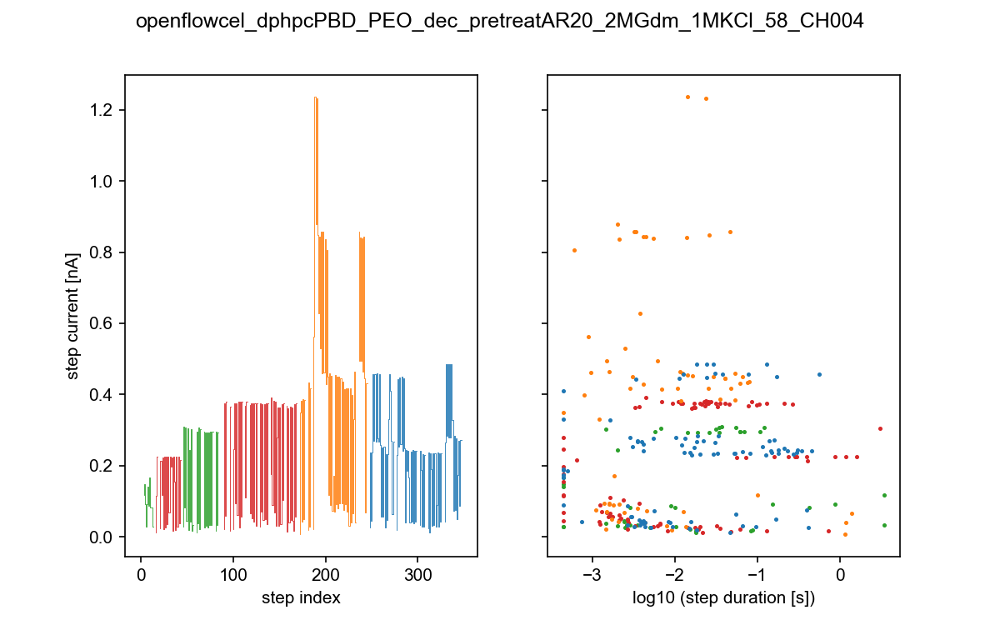

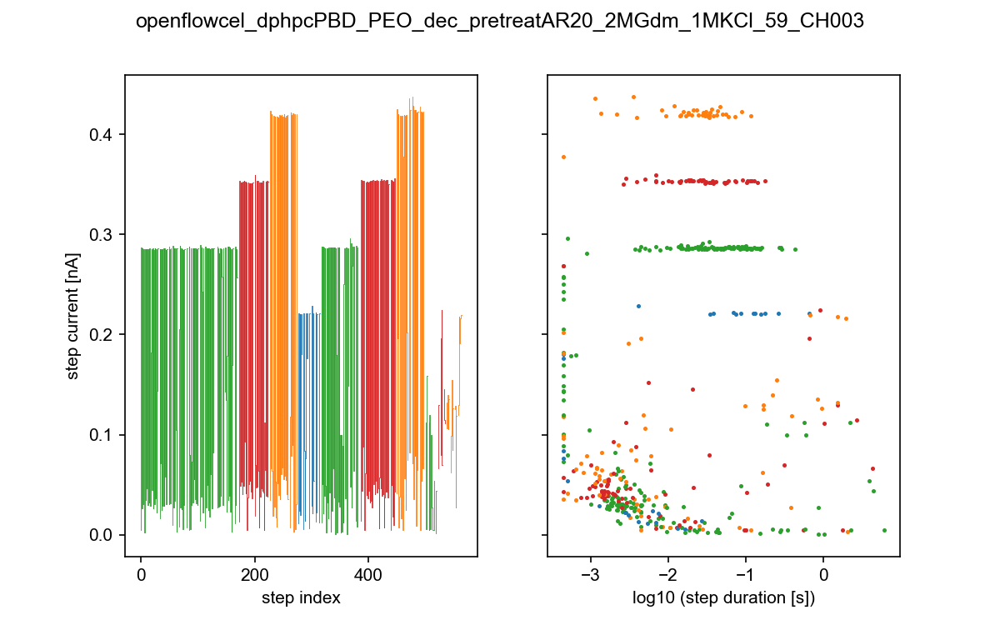

C:\Users\alito\AppData\Local\Temp\ipykernel_30872\3259378480.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,(ax0,ax1)=plt.subplots(1,2,num=200+i,clear=True,sharey=True,figsize=(8,5))


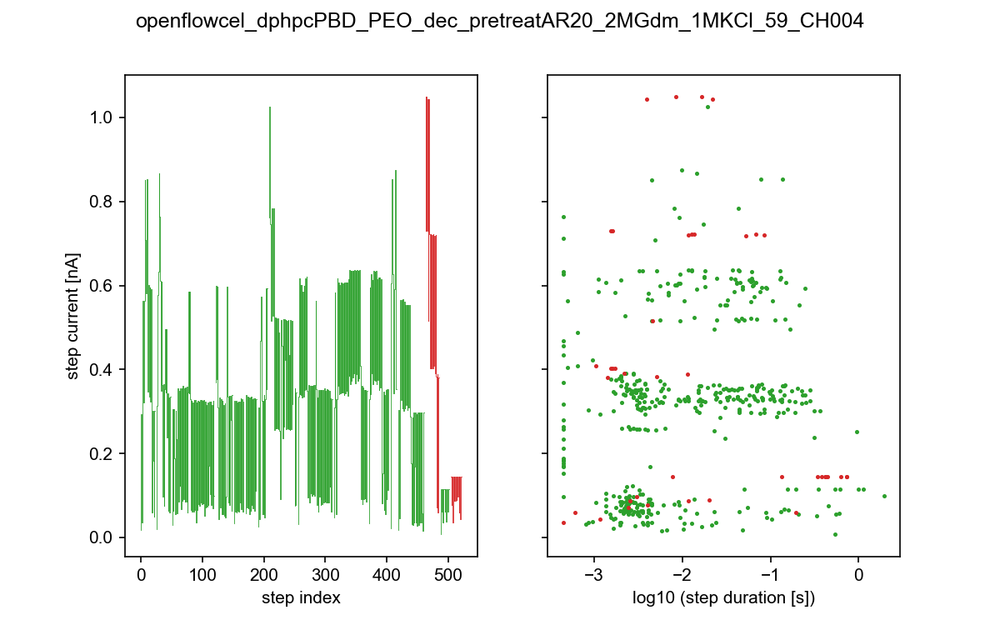

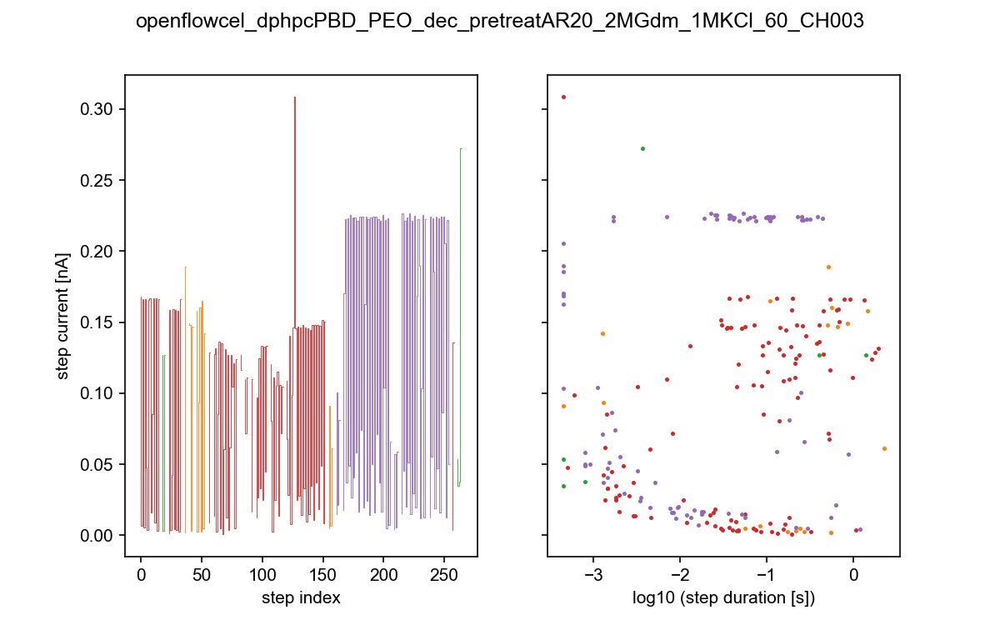

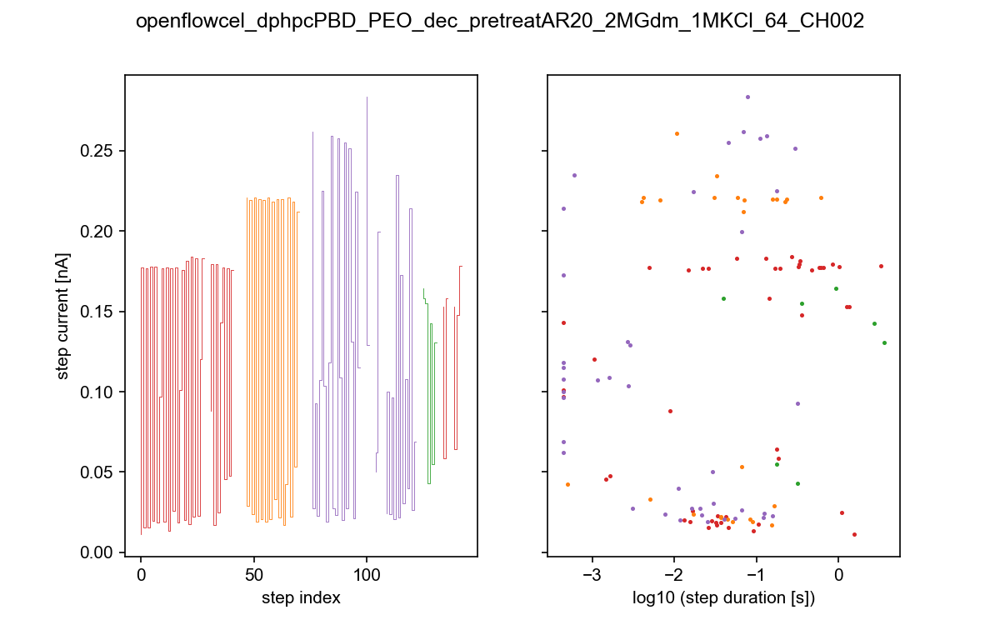

In [11]:
%matplotlib ipympl
color_map={0.125:"tab:grey",0.150:"tab:blue",0.175:"tab:green",0.200:"tab:red",0.225:"tab:orange",0.250:"tab:purple"}
print(color_map.keys())
plt.close('all')
for i,tf in enumerate(sfm.children):
    x=0
    fig,(ax0,ax1)=plt.subplots(1,2,num=200+i,clear=True,sharey=True,figsize=(8,5))
    
    for vstep in tf.traverse_to_rank("vstepgap"):
        
        if (vstep.children and len(vstep.children)>1):
            subset=[seg for seg in vstep.children if seg.mean>0]
            try:
                if subset[-1].mean<subset[-2].mean:
                    subset.pop(-1)
            except IndexError:
                continue
            logmeans=np.log10(np.array([seg.mean for seg in subset]))
            voltage=vstep.get_feature('voltage')
            try:
                color=color_map[round(float(voltage),3)]
            except KeyError:
                color="tab:olive"
            # logmeans+=9-np.log10(vstep.get_feature('voltage'))
            
            logmeans+=9
            # print(logmeans)
            logmeans=np.power(10,logmeans)
            logdwells=np.log10(np.array([seg.duration for seg in subset]))
            
            ax0.step(np.arange(len(logmeans))+x,logmeans,lw=0.4,c=color)
            ax1.scatter(logdwells,logmeans,s=2,c=color)
            
            x+=len(logmeans)
            x+=2
    fig.suptitle(tf.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax1.set_xlabel("log10 (step duration [s])")
    ax0.set_xlabel("step index")
    # ax0.set_ylabel("log10 (step current [nA])")
    # ax0.set_ylabel("step conductance [nS]")
    ax0.set_ylabel("step current [nA]")
    plt.show()
    
    
                    

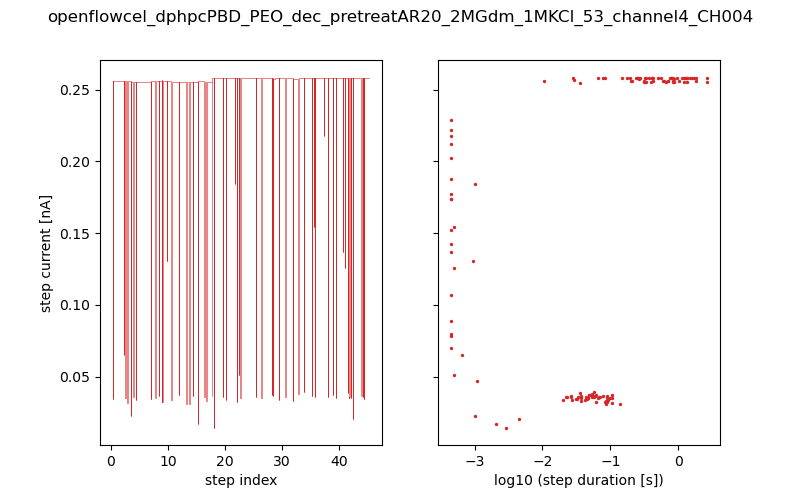

In [52]:
with open("P1_aHL_Hexamer_200mV.csv",'w') as csv_file:
    
    tf1=sfm.children[12]
    x=0
    fig,(ax0,ax1)=plt.subplots(1,2,num=312,clear=True,sharey=True,figsize=(8,5))
    for vstep in tf1.traverse_to_rank("vstepgap")[35:46]:
        
        if (vstep.children and len(vstep.children)>1) and np.isclose(vstep.get_feature('voltage'),0.2):
            subset=[seg for seg in vstep.children if seg.mean>0]
            try:
                if subset[-1].mean<subset[-2].mean:
                    subset.pop(-1)
            except IndexError:
                continue
            times=[seg.t for seg in subset]
            currents=[seg.current for seg in subset]
            logmeans=np.log10(np.array([seg.mean for seg in subset]))
            dwells=np.array([seg.duration for seg in subset])
            xs=np.cumsum(dwells) 
            voltage=vstep.get_feature('voltage')
            try:
                color=color_map[round(float(voltage),3)]
            except KeyError:
                color="tab:olive"
            # logmeans+=9-np.log10(vstep.get_feature('voltage'))
            
            logmeans+=9
            # print(logmeans)
            logmeans=np.power(10,logmeans)
            logdwells=np.log10(np.array([seg.duration for seg in subset]))
            
            ax0.step(xs+x,logmeans,lw=0.4,c=color)
            # for time, current in zip(times,currents):
                # ax0.plot(time,current*1e9,lw=0.4,c=color)
            ax1.scatter(logdwells,logmeans,s=2,c=color)
            for dwell,mean in zip(dwells,logmeans):
                csv_file.write(f"{dwell},{mean}\n")
            x+=xs[-1]
            x+=0.01
    fig.suptitle(tf1.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax1.set_xlabel("log10 (step duration [s])")
    ax0.set_xlabel("step index")
    # ax0.set_ylabel("log10 (step current [nA])")
    # ax0.set_ylabel("step conductance [nS]")
    ax0.set_ylabel("step current [nA]")
    plt.show()


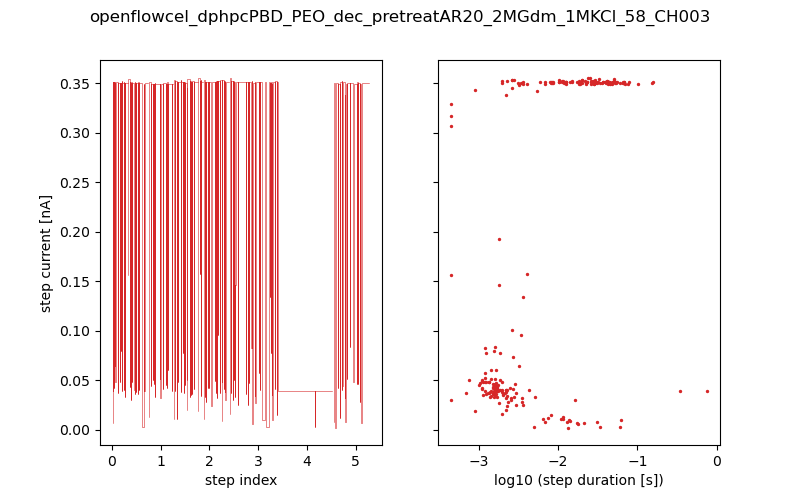

In [53]:
tf1=sfm.children[17]
x=0
fig,(ax0,ax1)=plt.subplots(1,2,num=317,clear=True,sharey=True,figsize=(8,5))
with open("P1_aHL_Heptamer_200mV.csv",'w') as csv_file:
    for vstep in tf1.traverse_to_rank("vstepgap")[120:152]:
        
        if (vstep.children and len(vstep.children)>1):
            subset=[seg for seg in vstep.children if seg.mean>0]
            try:
                if subset[-1].mean<subset[-2].mean:
                    subset.pop(-1)
            except IndexError:
                continue
            times=[seg.t for seg in subset]
            currents=[seg.current for seg in subset]
            logmeans=np.log10(np.array([seg.mean for seg in subset]))
            dwells=np.array([seg.duration for seg in subset])
            xs=np.cumsum(dwells) 
            voltage=vstep.get_feature('voltage')
            try:
                color=color_map[round(float(voltage),3)]
            except KeyError:
                color="tab:olive"
            # logmeans+=9-np.log10(vstep.get_feature('voltage'))
            
            logmeans+=9
            # print(logmeans)
            logmeans=np.power(10,logmeans)
            logdwells=np.log10(np.array([seg.duration for seg in subset]))
            
            ax0.step(xs+x,logmeans,lw=0.4,c=color)
            # for time, current in zip(times,currents):
                # ax0.plot(time,current*1e9,lw=0.4,c=color)
            ax1.scatter(logdwells,logmeans,s=2,c=color)
            for dwell,mean in zip(dwells,logmeans):
                csv_file.write(f"{dwell},{mean}\n")
            x+=xs[-1]
            x+=0.01
    fig.suptitle(tf1.get_feature('metadata')["HeaderFile"].split("\\")[-2])
    ax1.set_xlabel("log10 (step duration [s])")
    ax0.set_xlabel("step index")
    # ax0.set_ylabel("log10 (step current [nA])")
    # ax0.set_ylabel("step conductance [nS]")
    ax0.set_ylabel("step current [nA]")
    plt.show()


[1.758  0.1926 1.7567 ... 1.7151 0.2156 1.7523]
[ 1 -1  1 ... -1  1 -1]
[1.7736 0.2146 1.7585 ... 1.7475 0.1961 1.7535]
[ 1 -1  1 ... -1  1 -1]
[1.7557 0.2191 1.748  ... 1.7459 0.1972 1.7483]
[ 1 -1  1 ... -1  1 -1]
[1.764  0.196  1.7593 ... 1.7538 0.2519 1.7272]
[ 1 -1  1 ... -1  1 -1]
[1.7715 0.1637 1.7607 ... 1.7596 0.2065 1.755 ]
[ 1 -1  1 ... -1  1 -1]
[1.7782 0.7866 1.7602 ... 1.7646 0.2348 1.7557]
[ 1 -1  1 -1  1 -1]
[1.7668 0.1662 1.7567 ... 1.7618 0.1848 1.7646]
[ 1 -1  1 ... -1  1 -1]
[1.7655 0.2407 1.7655 ... 1.7556 0.1513 1.7581]
[ 1 -1  1 ... -1  1 -1]
[1.7792 0.1829 1.7616 ... 0.1974 0.0154 0.1967]
[ 1 -1  1 ...  1  0  0]
[1.7498 0.0392 0.0105 ... 1.7478 0.0356 1.7506]
[ 1  0 -1 ... -1  1 -1]


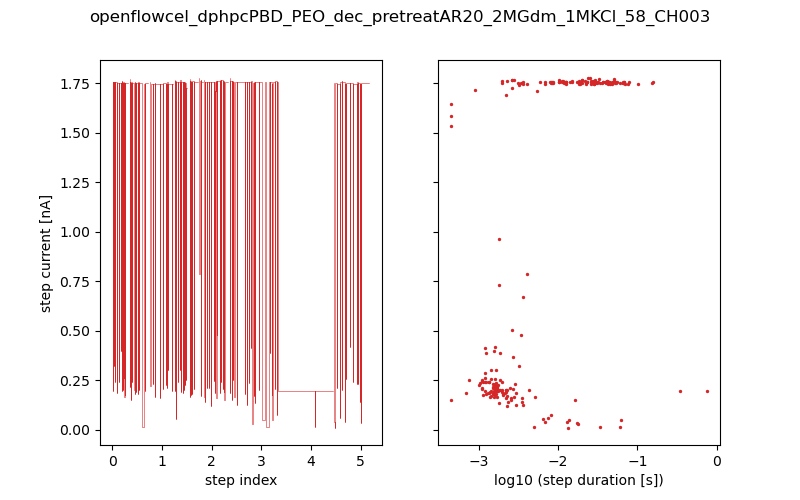

In [64]:
def detect_and_polish_events(segments,event_threshold):
    voltage=segments[0].get_feature("voltage")
    gs=np.array([(seg.mean/voltage*1e9) for seg in segments])
    tics=np.diff(np.where(gs<event_threshold*1e9,1,0))
    # print(tics)
    print(gs)
    print(tics)
tf1=sfm.children[17]
x=0
fig,(ax0,ax1)=plt.subplots(1,2,num=317,clear=True,sharey=True,figsize=(8,5))
for vstep in tf1.traverse_to_rank("vstepgap")[120:152]:
    
    if (vstep.children and len(vstep.children)>1):
        subset=[seg for seg in vstep.children if seg.mean>0]
        try:
            if subset[-1].mean<subset[-2].mean:
                subset.pop(-1)
            if subset[0].mean<subset[1].mean:
                subset.pop(0)
        except IndexError:
            continue
        detect_and_polish_events(subset,8e-10)
        
        times=[seg.t for seg in subset]
        currents=[seg.current for seg in subset]
        
        logmeans=np.log10(np.array([seg.mean for seg in subset]))
        dwells=np.array([seg.duration for seg in subset])
        xs=np.cumsum(dwells) 
        voltage=vstep.get_feature('voltage')
        try:
            color=color_map[round(float(voltage),3)]
        except KeyError:
            color="tab:olive"
        logmeans+=9-np.log10(vstep.get_feature('voltage'))
        
        # logmeans+=9
        # print(logmeans)
        logmeans=np.power(10,logmeans)
        logdwells=np.log10(np.array([seg.duration for seg in subset]))
        
        ax0.step(xs+x,logmeans,lw=0.4,c=color)
        # for time, current in zip(times,currents):
            # ax0.plot(time,current*1e9,lw=0.4,c=color)
        ax1.scatter(logdwells,logmeans,s=2,c=color)
        # for dwell,mean in zip(dwells,logmeans):
        #     csv_file.write(f"{dwell},{mean}\n")
        x+=xs[-1]
        x+=0.01
fig.suptitle(tf1.get_feature('metadata')["HeaderFile"].split("\\")[-2])
ax1.set_xlabel("log10 (step duration [s])")
ax0.set_xlabel("step index")
# ax0.set_ylabel("log10 (step current [nA])")
# ax0.set_ylabel("step conductance [nS]")
ax0.set_ylabel("step current [nA]")
plt.show()



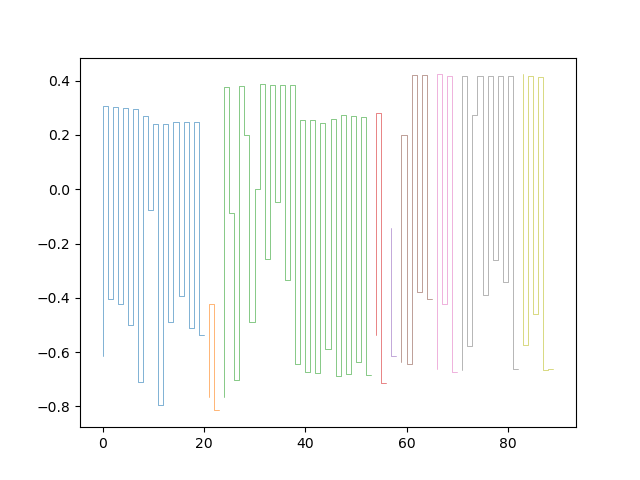

In [92]:
plt.show()